# Make Stats And Figs

A dedicated notebook for generating statistics and figures from sorting data.

Run after executing core modules. Will pull information from cached sorting and recording files in `sortings/`

In [1]:
!jupyter nbconvert --to script marshmakestatsandfigs-class.ipynb --TagRemovePreprocessor.remove_cell_tags='{"note"}' --output-dir /mnt/isilon/marsh_single_unit/MarshMountainSort/pys-class/mms --output figures

[NbConvertApp] Converting notebook marshmakestatsandfigs-class.ipynb to script
[NbConvertApp] Writing 38175 bytes to /mnt/isilon/marsh_single_unit/MarshMountainSort/pys-class/mms/figures.py


In [2]:
import os
import sys

# sys.path.append(os.path.abspath(".."))
sys.path.insert(0, os.path.abspath('..'))

# os.path.abspath("../")


In [3]:
# Python standard library
import csv
import datetime
import glob
import gzip
import os
import re
import shutil
import tempfile
from abc import ABC, abstractmethod
from concurrent.futures import ThreadPoolExecutor
from functools import reduce
from multiprocessing import Pool
from pathlib import Path
from textwrap import wrap
from typing import Literal
from warnings import warn, catch_warnings, simplefilter, filterwarnings
from tqdm.auto import tqdm as tqdmauto
from tqdm.dask import TqdmCallback

# Third party packages
import dateutil.parser as dparser
import matplotlib.pyplot as plt
import matplotlib.colors
import mountainsort5 as ms5
import numpy as np
import pandas as pd
import scipy.cluster.hierarchy as shc
import seaborn as sns
import spikeinterface.core as si
import spikeinterface.preprocessing as spre
import spikeinterface.extractors as se
import spikeinterface.postprocessing as spost
import spikeinterface.qualitymetrics as sqm
import spikeinterface.widgets as sw
from mountainsort5.util import create_cached_recording
from scipy.optimize import curve_fit
from scipy.signal import convolve, savgol_coeffs, savgol_filter, windows
from scipy.stats import norm, skewnorm, zscore, ttest_ind
from sklearn.decomposition import PCA
from sklearn.manifold import MDS
from sklearn.metrics.pairwise import euclidean_distances, manhattan_distances
from sklearn.preprocessing import StandardScaler
from pandarallel import pandarallel
import dask
from dask import delayed
from dask.distributed import Client
from dask.diagnostics import ProgressBar
from statannotations.Annotator import Annotator
from IPython.display import clear_output
import umap
import mne
import matplotlib.colors as colors

# Local imports
from mms import constants, core
from mms.parser import FolderPathParser

In [4]:
core.set_tempdir('/scr1/users/dongjp')


In [5]:
class DepthSheetReader():
    
    df_depths:pd.DataFrame = None
    df_optdepth:pd.DataFrame = None

    def __init__(self, base_folder: str, sortdir_name: str = 'sortings', truncate: bool = False, verbose: bool = True, omit: list[str] = []) -> None:
        self.base_folder = Path(base_folder)
        self.sortdir_name = sortdir_name
        self.sort_folder = self.base_folder / sortdir_name
        self.truncate = truncate
        self.verbose = verbose
        self.omit = omit

        self.sort_folders = self._glob_all_folders(self.sortdir_name)
        self.sort_all_ids = self._get_all_ids()

    # Theres some overlap in function implementation with core.IAnimalAnalyer,
    # but functionality > maintainability
    def _glob_all_folders(self, base_subdir_name:str):
        searchstring = self.base_folder / base_subdir_name / '*'
        subfolders = glob.glob(str(searchstring))
        subfolders = list(set(subfolders))
        subfolders = [x for x in subfolders if os.path.isdir(x)]
        subfolders = [x for x in subfolders if not any(substring in x for substring in self.omit)]
        subfolders.sort()
        return subfolders

    def make_filenametodepth_xlsx(self, xlsx_name:str='filename-to-depth.xlsx', xlsx_dir_name:str='xlsxs', read_old:bool=True):
        # self.sort_folders = self._glob_all_folders(self.sortdir_name)
        names = [FolderPathParser.parse_name(f) for f in self.sort_folders]
        ids = [FolderPathParser.parse_id(f, as_int=True) for f in self.sort_folders]
        genotypes = [FolderPathParser.parse_genotype(f) for f in self.sort_folders]
        dates = [FolderPathParser.parse_date(f) for f in self.sort_folders]
        df = pd.DataFrame({'folder' : self.sort_folders,
                           'name' : names,
                           'id' : ids,
                           'genotype' : genotypes,
                           'date' : dates,
                           'depth' : np.nan * len(self.sort_folders)})
        # df['id'] = df['id'].astype(str)
        today = datetime.date.today().strftime(r'%m-%d-%Y')
        out_path = self.base_folder / xlsx_dir_name / xlsx_name

        if read_old:
            # Merge all old spreadsheets
            cols = df.columns.drop(['depth']).tolist() # Without dropping depth this would just be concat
            dfs_old = pd.read_excel(out_path, sheet_name=None, index_col=0)
            dfs_old = list(dfs_old.values())
            dfs = [df] + dfs_old
            df_merge = reduce(lambda left,right: pd.merge(left, right, on=cols, how='outer', suffixes=('', '_y')), 
                              dfs)
            # Pull last value updated in the spreadsheet for each recording
            mapping = {'depth':'depth', 'depth_y':'depth'}
            mapping.update({k:v for k,v in zip(cols, cols)})
            df_last:pd.DataFrame = df_merge.set_index('name').T.groupby(mapping).last()
            df_last = df_last.T.reset_index().fillna(value=np.NaN)
            df_out = df_last[df.columns]
            
            df = df_out
            
        with pd.ExcelWriter(out_path, engine='openpyxl', mode='a', if_sheet_exists='new') as writer:
            df.to_excel(writer, sheet_name=today)
    
    def read_filenametodepth_xlsx(self, xlsx_name:str='filename-to-depth.xlsx', xlsx_dir_name:str='xlsxs', sheet_name=-1):
        sheet_path = self.base_folder / xlsx_dir_name / xlsx_name
        if sheet_name is None:
            df = pd.read_excel(sheet_path, sheet_name=-1, index_col=0)
        else:
            df = pd.read_excel(sheet_path, sheet_name=sheet_name, index_col=0)
        DepthSheetReader.df_depths = df
        return df
    
    @staticmethod
    def get_row_from_depth_df(identifier:int, region:str, depth:float=None, name:str=None):
        if depth is None and name is None:
            raise TypeError("Cannot have both depth and name as None")
        mask = DepthSheetReader.df_depths['id'] == identifier
        if depth is not None and depth == depth:
            mask = mask & (DepthSheetReader.df_depths['depth'] == depth)
        if name is not None and name == name:
            mask = mask & (DepthSheetReader.df_depths['name'] == name)

        df_mask = DepthSheetReader.df_depths[mask]
        if len(df_mask.index) == 0:
            warn("No match found for criteria")
            return None
        elif len(df_mask.index) >= 2:
            raise ValueError("Too many matches found for criteria")

        return df_mask.iloc[0]

    @staticmethod
    def __validate_and_get_dfdepth() -> pd.DataFrame:
        if DepthSheetReader.df_depths is None:
            raise TypeError('df_depths was not generated yet')
        return DepthSheetReader.df_depths

    @staticmethod
    def parse_depth(path:str):
        df = DepthSheetReader.__validate_and_get_dfdepth()
        name = FolderPathParser.parse_name(path)
        value = df.loc[df['name'] == name, 'depth']
        if len(value.index) == 0:
            raise IndexError('Path not found: {path}')
        elif len(value.index) >= 2:
            raise ValueError('Too many depths found for path: {path}')
        return value.iloc[0]

    def plot_all_depths_regions(self, identifier:int, output_subdir:str, sort_by_depth=True, save_figs=True, 
                                location_method: Literal['monopolar_triangulation', 'center_of_mass'] = 'monopolar_triangulation', **kwargs):
        df = DepthSheetReader.__validate_and_get_dfdepth()
        df = df[df['id'] == identifier]
        if sort_by_depth:
            if len(df.index) == 0:
                raise KeyError(f'ID {identifier} not found in depth short spreadsheet. sort_by_depth=True')
            df = df.sort_values(['depth', 'date', 'name'], ascending=[True, True, True])
            order = df['name'].tolist()
        else:
            order = None
        
        asl = core.AnimalSortLoader(self.base_folder, identifier=identifier, sortdir_name=self.sortdir_name)    
        
        for region in constants.REGIONS:
            asl.load_sortings_df()
            asl.extract_analyzers_df()

            asl.compute_extension_df(extension='random_spikes', region=region, max_spikes_per_unit=1000, **kwargs)
            asl.compute_extension_df(extension='waveforms', region=region, ms_before=1.0, ms_after=2.0, **kwargs)
            asl.compute_extension_df(extension='templates', region=region, ms_before=1.0, ms_after=2.0, **kwargs)
            asl.compute_extension_df(extension='spike_locations', region=region, ms_before=1.0, ms_after=2.0, method=location_method, **kwargs)
            # asl.compute_extension_df(extension='spike_locations', region=region, ms_before=0.5, ms_after=0.5, method='center_of_mass')

            tempsavepath = asl.base_folder / Path(output_subdir) / str(asl.identifier) / region
            if sort_by_depth:
                titles = df.apply(self.__get_title_from_row, axis=1, region=region).tolist()
            else:
                titles = None
            plot_params = {'region' : region,
                           'max_cols' : 10,
                           'order' : order,
                           'titles' : titles}
            asl.plot_units_oneregion(xybound_location=(-30, 30), plot_type='location', save_path=tempsavepath / 'location' if save_figs else None, **plot_params)
            asl.plot_units_oneregion(ybound_heatmap=(-200, 100), plot_type='heatmap', save_path=tempsavepath / 'heatmap' if save_figs else None, **plot_params)
            asl.plot_units_oneregion(ybound_wavetemp=(-40, 40), plot_type='waveform', save_path=tempsavepath / 'waveform' if save_figs else None, **plot_params)
            asl.plot_units_oneregion(ybound_wavetemp=(-40, 40), plot_type='template', save_path=tempsavepath / 'template' if save_figs else None, **plot_params)

            
    def __get_title_from_row(self, x:pd.Series, region:str):
        name = x['name']
        name = '\n'.join(wrap(name, 40))
        return f"{name}\n{x.id} | {x.genotype} | {x.depth} turns | {x.date.strftime(r'%m/%d/%Y')} | {region}"

    def _get_all_ids(self):
        ids = [FolderPathParser.parse_id(f, as_int=True) for f in self.sort_folders]
        ids = list(set(ids))
        ids.sort()
        return ids

    def make_animaltobestdepth_xlsx(self, xlsx_name:str='animal-to-bestdepth.xlsx', xlsx_dir_name:str='xlsxs', read_old:bool=True):
        
        sort_regs = sorted(constants.REGIONS)
        df = pd.DataFrame(
            {'id' : self.sort_all_ids,
            'region' : [sort_regs] * len(self.sort_all_ids),
            'best_depth' : [None] * len(self.sort_all_ids),
            'name' : [None] * len(self.sort_all_ids)}
        )
        df = df.explode(column='region')
        df = df.reset_index(drop=True)
        today = datetime.date.today().strftime(r'%m-%d-%Y')
        out_path = self.base_folder / xlsx_dir_name / xlsx_name

        if read_old:
            # Merge all old spreadsheets
            cols = df.columns.drop(['best_depth', 'name']).tolist()
            dfs_old = pd.read_excel(out_path, sheet_name=None, index_col=0)
            dfs_old = list(dfs_old.values())
            dfs = [df] + dfs_old
            df_merge = reduce(lambda left,right: pd.merge(left, right, on=cols, how='outer', suffixes=('', '_y')), 
                              dfs)

            # Pull last value updated in the spreadsheet for each recording
            mapping = {'best_depth':'best_depth', 'best_depth_y':'best_depth',
                       'name':'name', 'name_y':'name'}
            mapping.update({k:v for k,v in zip(cols, cols)})
            df_last:pd.DataFrame = df_merge.set_index(['id', 'region']).T.groupby(mapping).last()
            df_last = df_last.T.reset_index().fillna(value=np.NaN)
            df_out = df_last[df.columns]
            
            df = df_out

        with pd.ExcelWriter(out_path, engine='openpyxl', mode='a', if_sheet_exists='new') as writer:
            df.to_excel(writer, sheet_name=today)
    

    def read_animaltobestdepth_xlsx(self, xlsx_name:str='animal-to-bestdepth.xlsx', xlsx_dir_name:str='xlsxs', sheet_name=-1, drop_na:bool=True):
        sheet_path = self.base_folder / xlsx_dir_name / xlsx_name
        if sheet_name is None:
            df = pd.read_excel(sheet_path, sheet_name=-1, index_col=0)
        else:
            df = pd.read_excel(sheet_path, sheet_name=sheet_name, index_col=0)
            
        if drop_na:
            df = df.dropna(how='all', subset=['best_depth', 'name'])
            df = df.reset_index(drop=True)
        
        DepthSheetReader.df_optdepth = df
        return df
    

In [6]:
class IExperimentAnalyzer(ABC):
    EXTENSION_PARAMS = {
        'random_spikes' : {'max_spikes_per_unit':1000},
        # 'waveforms' : dict({'ms_before':1.0, 'ms_after':2.0}, **constants.FAST_JOB_KWARGS),
        'waveforms' : {'ms_before':1.0, 'ms_after':2.0},
        'templates' : {'ms_before':1.0, 'ms_after':2.0},
        # 'spike_locations' : {'ms_before':1.0, 'ms_after':2.0, 'method':'center_of_mass'},
        # 'spike_locations' : {'ms_before':1.0, 'ms_after':2.0, 'method':'monopolar_triangulation'},
        # 'principal_components' : {'mode':'concatenated'},
        'principal_components' : {'mode':'by_channel_local'},
        # 'spike_amplitudes' : constants.FAST_JOB_KWARGS,
        'spike_amplitudes' : {},
        'noise_levels' : {},
    }
    # QUALITY_METRIC_FEATURES = sqm.get_quality_metric_list() + sqm.get_quality_pca_metric_list()
    # TEMPLATE_METRIC_FEATURES = spost.get_template_metric_names()
    QUALITY_METRIC_FEATURES = ['num_spikes', 'firing_rate', 'presence_ratio', 'snr',
       'isi_violations_ratio', 'isi_violations_count', 'rp_contamination',
       'rp_violations', 'sliding_rp_violation', 'amplitude_cutoff',
       'amplitude_median', 'amplitude_cv_median', 'amplitude_cv_range',
       'sync_spike_2', 'sync_spike_4', 'sync_spike_8', 'firing_range',
       'sd_ratio', 'isolation_distance', 'l_ratio', 'd_prime', 'silhouette',
       'nn_hit_rate', 'nn_miss_rate']
    TEMPLATE_METRIC_FEATURES = ['peak_to_valley', 'peak_trough_ratio',
       'half_width', 'repolarization_slope', 'recovery_slope',
       'num_positive_peaks', 'num_negative_peaks', 'velocity_above',
       'velocity_below', 'exp_decay', 'spread']
    DO_NOT_EXPLODE_FEATURES = ['id', 'region', 'best_depth', 'name', 'sa', 'sa_savedir', 'rec_duration', 'n_units', 'waveform']
    UNIT_UNIQUE_FEATURES = ['id', 'region', 'best_depth', 'name', 'sa', 'sa_savedir', 'rec_duration', 'n_units', 'unit', 'waveform']
    BAD_FEATURES = ['sliding_rp_violation', 'velocity_above', 'velocity_below',
                    'amplitude_cutoff', 'amplitude_cv_median', 'amplitude_cv_range',
                    'exp_decay']
    
    @abstractmethod
    def __init__(self):
        super().__init__()
        self.df_all_units: pd.DataFrame = None
    
    def get_df(self, 
               drop_nan_rows=False, 
               drop_nan_ignorecols:list[str]=[], 
               drop_bad_cols=True, 
               drop_unit_unique_cols=False, 
               drop_extra_cols:list[str]=None, 
               drop_extra_cols_substr:list[str]=None,
               only_get_cols:list[str]=None,
               only_get_cols_substr:list[str]=None):
        df = self.df_all_units.copy()
        
        if only_get_cols is not None or only_get_cols_substr is not None:
            all_columns = []

            if only_get_cols is not None:
                all_columns.extend(only_get_cols)

            # Get list of cols using substrings
            if only_get_cols_substr is not None:
                for f in only_get_cols_substr:
                    all_columns.extend([x for x in df.columns if f in x])

            # Union with only_get_cols
            all_columns = list(set(all_columns))
            df = df.loc[:, all_columns]
            
        else:
            dropcols = []
            if drop_bad_cols:
                dropcols.extend(self.BAD_FEATURES)
            if drop_unit_unique_cols:
                dropcols.extend(self.UNIT_UNIQUE_FEATURES)
            if drop_extra_cols is not None:
                dropcols.extend(drop_extra_cols)
            if drop_extra_cols_substr is not None:
                matches = [[x for x in df.columns if substr in x] for substr in drop_extra_cols_substr]
                matches = [x for xs in matches for x in xs]
                # matches = np.array(matches)
                # matches = matches.flatten('C')
                dropcols.extend(matches)

            df = df.drop(dropcols, axis=1, errors='ignore')

        if drop_nan_rows:
            df = df.dropna(axis=0, subset=df.columns.difference(self.UNIT_UNIQUE_FEATURES + drop_nan_ignorecols))

        return df


In [7]:
class ExperimentFeatureExtractor(core.IAnimalAnalyzer, IExperimentAnalyzer):

    def __init__(self, base_folder: str, dsr:DepthSheetReader, sortdir_name: str = 'sortings', 
                 truncate: bool | int = False, verbose: bool = True, omit_id:list[int] = [],
                 multiprocess: bool = True, ignore_warnings:bool=True, **kwargs):
        super().__init__(base_folder, '', '', sortdir_name, bool(truncate), verbose, [])
        self._dsr = dsr
        self.__filename_to_depth_df = self._dsr.read_filenametodepth_xlsx()
        self.__animal_to_best_depth_df = self._dsr.read_animaltobestdepth_xlsx()
        self.ignore_warnings = ignore_warnings
        self.omit_id = omit_id
        self.df_all_units: pd.DataFrame = self.__animal_to_best_depth_df.copy()
        self.df_all_units = self.df_all_units[~self.df_all_units['id'].isin(self.omit_id)]
        if truncate:
            if type(truncate) is int:
                self.df_all_units = self.df_all_units.sample(truncate, random_state=43)
            else:
                self.df_all_units = self.df_all_units.sample(3, random_state=43)

        # Process rows in parallel using multiprocessing
        if multiprocess:
            delayed_tasks = [delayed(self._init_process_row_no_sa)(row) for row in self.df_all_units.to_dict(orient='records')]
            with TqdmCallback(desc='Processing rows'):
                results = dask.compute(*delayed_tasks)
        else:
            results = self.df_all_units.apply(self._init_process_row_no_sa, axis=1)
            results = results.to_dict(orient='records')

        results = pd.DataFrame(results)
        results = results.dropna(how='all')
        self.df_all_units = results

        # Load sorting analyzers from file
        self.df_all_units['sa'] = self.df_all_units['sa_savedir'].apply(lambda x: si.load_sorting_analyzer(x / 'result.zarr', format='zarr'))

    def _init_process_row_no_sa(self, row:dict):
        row: pd.Series = pd.Series(row)
        if self.verbose:
            print(f"Loading recording: {row['id']} {row['region']} {row['best_depth']} {row['name']}\n", flush=True)
        folderpath = DepthSheetReader.get_row_from_depth_df(identifier=row['id'],
                                                            region=row['region'],
                                                            depth=row['best_depth'],
                                                            name=row['name']).folder
        sa = core.AnimalSortLoader.load_sortinganalyzer(folderpath, region=row['region'])
        if sa is None:
            return pd.Series([])

        temp_dir = Path(tempfile.gettempdir()) / os.urandom(24).hex()
        os.makedirs(temp_dir)
        row['sa'] = sa
        row['sa_savedir'] = temp_dir
        row['n_units'] = row['sa'].get_num_units()
        row['unit'] = list(range(1, row['sa'].get_num_units() + 1))
        row['rec_duration'] = row['sa'].get_total_duration()
        
        with catch_warnings():
            if self.ignore_warnings:
                filterwarnings('ignore')
            else:
                filterwarnings('ignore', message='With less than 10 channels, multi-channel metrics might not be reliable.')
                filterwarnings('ignore', message='`n_jobs` is not set so parallel processing is disabled!')
            
            for k, ext_kwargs in ExperimentFeatureExtractor.EXTENSION_PARAMS.items():
                sa.compute_one_extension(k, **(ext_kwargs))

            row = self.__compute_qm_row(row)
            row = self.__compute_tm_row(row)
            
        row = row.apply(lambda x: x.tolist() if isinstance(x, pd.Series) else x)
        sa.save_as(format='zarr', folder=row['sa_savedir'] / 'result.zarr')
        row.drop('sa', inplace=True)

        return row

    def __compute_qm_row(self, row: pd.Series):
        sa:si.SortingAnalyzer = row['sa']
        qm_ext = sa.compute('quality_metrics', skip_pc_metrics=False)
        metrics = qm_ext.get_data()
        for col in metrics.columns:
            row[col] = metrics[col]
        return row
    
    def __compute_tm_row(self, row:pd.Series):
        sa:si.SortingAnalyzer = row['sa']
        tm_ext = sa.compute('template_metrics', include_multi_channel_metrics=True)
        metrics = tm_ext.get_data()
        for col in metrics.columns:
            row[col] = metrics[col]
        return row
    
    def compute_mds_wave_features(self, n_components=4, in_place=True, df=None):
        df = self.df_all_units if df is None else df
        df = df.apply(self.__compute_waveform_row, axis=1)
        
        # Apply MDS
        X_waves = df['waveform']
        X_waves = np.array(X_waves.tolist())
        dist_waves = euclidean_distances(X_waves) # Get L2 norm between waveforms
        mds = MDS(n_components=n_components, dissimilarity='precomputed')
        X_transform = mds.fit_transform(dist_waves)

        X_dict = {f'mds_wave_{i}' : X_transform[:, i] for i in range(X_transform.shape[1])}
        df = df.assign(**X_dict)
        
        if in_place:
            self.df_all_units = df
        return df
    
    def __compute_waveform_row(self, row: pd.Series):
        sa: si.SortingAnalyzer = row['sa']
        if sa is None:
            row['waveform'] = None
        else:
            unit = row['unit'] # NOTE this is still a list
            ext_tmp: si.AnalyzerExtension = sa.get_extension('templates')
            # Workaround since SortingAnalyzer lacks a direct get_template method
            data = ext_tmp.get_data()
            extremum_ch = si.get_template_extremum_channel(sa, outputs='index')[unit]
            wave = data[unit - 1, :, extremum_ch]
            wave = (wave - wave.mean()) / wave.std() # NOTE standardizing the waveform
            row['waveform'] = wave
        return row

    def explode_dataframe(self, in_place=True, df=None):
        """
        Run this after quality or template metrics.
        """
        df = self.df_all_units if df is None else df
        explodecols = df.columns.difference(self.DO_NOT_EXPLODE_FEATURES, sort=False)
        explodecols = [x for x in explodecols if x in df.columns]
        df = df.explode(explodecols)
        if in_place:
            self.df_all_units = df
        return df

    def convert_datatypes(self, in_place=True, df=None):
        df = self.df_all_units if df is None else df
        datacols = df.columns.difference(self.DO_NOT_EXPLODE_FEATURES, sort=False)
        replace_dict = {'<NA>':np.nan, 'NA':np.nan, pd.NA:np.nan, None:np.nan}
        replace_dict = {x : replace_dict for x in datacols}
        df = df.replace(replace_dict)
        df = df.convert_dtypes()
        if in_place:
            self.df_all_units = df
        return df
    
    def find_outliers(self, mode: Literal['iqr', 'std'] = 'iqr', iqr_mult:float = 1.5, std_mult:float = 3, 
                        ignore_cols: list[str]=['num_spikes', 'isi_violations_count', 'rp_violations'], 
                        ignore_cols_substr: list[str]=['num_'], 
                        only_get_cols: list[str]=None,
                        only_get_cols_substr: list[str]=None,
                        plot_rejects:bool = True,
                        y_bound:list[int] = [-200, 100],
                        in_place=True, df: pd.DataFrame=None):
        
        df = self.df_all_units if df is None else df
        
        ignore_cols = [] if ignore_cols is None else ignore_cols
        # datacols = df.columns.difference(self.DO_NOT_EXPLODE_FEATURES + self.BAD_FEATURES + ignore_cols, sort=False)
        # print(datacols)
        datacols = self.get_df(drop_unit_unique_cols=True, 
                               drop_extra_cols=ignore_cols, 
                               drop_extra_cols_substr=ignore_cols_substr, 
                               only_get_cols=only_get_cols,
                               only_get_cols_substr=only_get_cols_substr).columns

        match mode:
            case 'iqr':
                dfiqr = df[datacols].quantile([0.25, 0.75])
                dfiqr.loc['iqr'] = dfiqr.iloc[1] - dfiqr.iloc[0]
                dfiqr.loc['min_bound'] = dfiqr.iloc[0] - iqr_mult * dfiqr.loc['iqr']
                dfiqr.loc['max_bound'] = dfiqr.iloc[1] + iqr_mult * dfiqr.loc['iqr']
                dfrange = dfiqr
            case 'std':
                std = df[datacols].std()
                mean = df[datacols].mean()
                dfrange = pd.concat([std, mean], axis=1)
                dfrange.loc['min_bound'] = dfrange['mean'] - std_mult * dfrange['std']
                dfrange.loc['max_bound'] = dfrange['mean'] + std_mult * dfrange['std']
            case _:
                raise ValueError(f'Invalid mode {mode}')
            
        df['reject'] = False
        for col in datacols:
            min_val = dfrange.loc['min_bound'][col]
            max_val = dfrange.loc['max_bound'][col]
            
            prev_reject = df['reject']
            df['reject'] = df['reject'] | (df[col] < min_val) | (df[col] > max_val)
            n_new_reject = df['reject'].sum() - prev_reject.sum()
            print(f'{col}: {n_new_reject} outliers')

            if plot_rejects and n_new_reject > 0:
                sas = df.loc[df['reject'] != prev_reject]
                fig, ax = plt.subplots(1, n_new_reject, figsize=(n_new_reject * 1.5, 1.5), squeeze=False, sharey=True)
                for i, (index, row) in enumerate(sas.iterrows()):
                    sw.plot_unit_waveforms_density_map(row['sa'], use_max_channel=True, unit_ids=[row['unit']], ax=ax[0, i])
                    ax[0, i].set_facecolor('black')
                    ax[0, i].set_ylabel('')
                    ax[0, i].set_title(f"{row['id']} {row['region']} #{row['unit']}")
                    ax[0, i].text(0.05, 0.05, f"n={row['num_spikes']} / {round(row['num_spikes']/row['rec_duration'], 2)} Hz", 
                            transform=ax[0, i].transAxes, 
                            ha='left', va='bottom', c='xkcd:orange', fontsize='small', fontweight='bold')
                    ax[0, i].set_ybound(y_bound)
                fig.suptitle(col, y=1.25)
            
        if in_place:
            self.df_all_units = df
        return df

    def compute_clusters(self, only_get_cols:list[str]=None, only_get_cols_substr: list[str] = None, threshold=0.7, reject_outliers=True, plot_tree=True, in_place=True, df=None):
        df = self.df_all_units if df is None else df
        
        features = self.get_df(drop_bad_cols=True).columns

        if only_get_cols_substr is not None:
            allfeats = self.get_df(only_get_cols=only_get_cols, only_get_cols_substr=only_get_cols_substr).columns
            allfeats = sorted(allfeats.tolist())
            print(f"Features used for clustering: {allfeats}")
            
            features = allfeats + self.UNIT_UNIQUE_FEATURES + ['reject']

        df2 = df.drop(df.columns.difference(features), axis=1, errors='ignore')
        df2 = df2.dropna(axis=0, subset=df2.columns.difference(self.DO_NOT_EXPLODE_FEATURES))

        if reject_outliers:
            if 'reject' in df2.columns:
                df2 = df2[~df2['reject']]
            else:
                warn("Dataframe missing 'reject' column. Skipping outlier rejection..")

        df3 = df2.drop(self.UNIT_UNIQUE_FEATURES, axis=1, errors='ignore')
        df3_std = StandardScaler().fit_transform(df3)

        clusters = shc.linkage(df3_std, method='ward', metric='euclidean', optimal_ordering=True)
        self.Z_linkage = clusters
        threshold = threshold * max(clusters[:,2])
        cluster_labels = shc.fcluster(Z=clusters, t=threshold, criterion='distance')

        df2 = df2.assign(cluster=cluster_labels)
        df2['cluster'] = pd.to_numeric(df2['cluster'])
        df2 = df2.drop(df2.columns.difference(list(set(self.UNIT_UNIQUE_FEATURES) - set(['waveform'])) + ['cluster']), axis=1)
        df = df.merge(df2, how='left', on=list(set(self.UNIT_UNIQUE_FEATURES) - set(['waveform'])))
        
        if plot_tree:
            fig, ax = plt.subplots(1, 1, figsize=(10, 6))
            shc.dendrogram(Z=clusters, ax=ax, color_threshold=threshold)
            ax.axhline(threshold, c='black', ls='--')
            plt.show()

        if in_place:
            self.df_all_units = df
        return df



In [8]:
class ExperimentPlotter(core.IAnimalAnalyzer, IExperimentAnalyzer):

    def __init__(self, base_folder:str, efe:ExperimentFeatureExtractor = None,
                 dsr:DepthSheetReader = None, sortdir_name:str = 'sortings', 
                 truncate: bool = False, verbose: bool = True):
        super().__init__(base_folder, '', '', sortdir_name, truncate, verbose, omit=None)
        self.df_all_units = efe.get_df(drop_bad_cols=False)
        self._dsr = dsr if dsr is not None else efe._dsr
        self.__filename_to_depth_df = self._dsr.read_filenametodepth_xlsx()
        self.__animal_to_best_depth_df = self._dsr.read_animaltobestdepth_xlsx()
        if truncate:
            self.df_all_units = self.df_all_units.sample(10)

    def __get_clusterdf_clusterids_colorvec(self, features:list[str]=None, random_state:int=None):
        df = self.get_df(drop_nan_rows=True, drop_unit_unique_cols=True, drop_extra_cols=['cluster'])
        if features is not None:
            df = df.drop(df.columns.difference(features), axis=1)
        if 'reject' in df.columns:
            df = df[~df['reject']]
            
        df_clusters = self.get_df(drop_nan_rows=True)
        cluster_ids = df_clusters["cluster"].to_numpy(int)
        colorvec = [f'C{int(x)}' for x in df_clusters['cluster']]
        return df, cluster_ids, colorvec

    def __aggregate_and_show_legend(self, ax):
        handles, labels = ax.get_legend_handles_labels()
        by_label = dict(zip(labels, handles))
        plt.legend(by_label.values(), by_label.keys(), bbox_to_anchor=[1.05, 0.5], loc='center left')

    def plot_pca(self, features:list[str]=None):
        df_pca, cluster_ids, colorvec = self.__get_clusterdf_clusterids_colorvec()

        df_pca = StandardScaler().fit_transform(df_pca)
        pca = PCA(n_components=2)
        X_transform = pca.fit_transform(df_pca)

        fig, ax = plt.subplots(1, 1)
        for i in range(X_transform.shape[0]):
            ax.scatter(X_transform[i, 0], X_transform[i, 1], c=colorvec[i], label=f'Cluster {cluster_ids[i]}')

        self.__aggregate_and_show_legend(ax)

        plt.title('PCA Plot')
        plt.show()

    def plot_mds(self, features:list[str]=None, random_state:int=None):
        df_mds, cluster_ids, colorvec = self.__get_clusterdf_clusterids_colorvec()

        df_mds = StandardScaler().fit_transform(df_mds)
        mds = MDS(n_components=2, random_state=random_state)
        X_transform = mds.fit_transform(df_mds)

        fig, ax = plt.subplots(1, 1)
        for i in range(X_transform.shape[0]):
            ax.scatter(X_transform[i, 0], X_transform[i, 1], c=colorvec[i], label=f'Cluster {cluster_ids[i]}')

        self.__aggregate_and_show_legend(ax)

        plt.title('MDS Plot')
        plt.show()

    def plot_umap(self, features:list[str]=None, random_state:int=None):
        df_umap, cluster_ids, colorvec = self.__get_clusterdf_clusterids_colorvec()

        df_umap = StandardScaler().fit_transform(df_umap)
        umap_model = umap.UMAP(random_state=random_state)
        X_transform = umap_model.fit_transform(df_umap)

        fig, ax = plt.subplots(1, 1)
        for i in range(X_transform.shape[0]):
            ax.scatter(X_transform[i, 0], X_transform[i, 1], c=colorvec[i], label=f'Cluster {cluster_ids[i]}')

        self.__aggregate_and_show_legend(ax)

        plt.title('UMAP Plot')
        plt.show()

    def plot_mds_waveforms(self, features:list[str]=None, width=2, height_mult=0.1, random_state:int=None):
        df_mds, cluster_ids, colorvec = self.__get_clusterdf_clusterids_colorvec()

        waveforms = np.array(self.get_df(drop_nan_rows=True)['waveform'].tolist())
        waveforms *= height_mult
        xvals = np.linspace(-width/2, width/2, waveforms.shape[1])

        df_mds = StandardScaler().fit_transform(df_mds)
        mds = MDS(n_components=2, random_state=random_state)
        X_transform = mds.fit_transform(df_mds)

        fig, ax = plt.subplots(1, 1)
        for i in range(X_transform.shape[0]):
            ax.plot(xvals + X_transform[i, 0], waveforms[i, :] + X_transform[i, 1], c=colorvec[i], label=f'Cluster {cluster_ids[i]}')
            
        self.__aggregate_and_show_legend(ax)

        plt.title('MDS Plot with Waveforms')
        plt.show()

    def plot_cluster_waveforms(self):
        df_waves = self.get_df(drop_nan_rows=True, drop_nan_ignorecols=['cluster'], )
        # display(df_waves[df_waves['reject'] == True])
        df_waves.groupby('cluster', dropna=False).apply(self.__df_cluster_groupby_func)

    def __df_cluster_groupby_func(self, df: pd.DataFrame):
        n = df.index.size
        n_col = 10
        n_row = n // n_col + 1
        fig, axes = plt.subplots(n_row, n_col, figsize=(n_col*2, n_row*2), sharex=True, sharey=True, squeeze=False)
        axes[0, 0].set_aspect('equal')
        axes[0, 0].set_ylim(-20, 20)
        for i, (index, row) in enumerate(df.iterrows()):
            ax = axes[i // n_col, i % n_col]
            sw.plot_unit_waveforms(row['sa'],
                                    unit_ids=[row['unit']],
                                    templates_percentile_shading=None,
                                    alpha_waveforms=0.1,
                                    set_title=False,
                                    scale=1e16,
                                    same_axis=True,
                                    plot_legend=False,
                                    ax=ax)
            if row['reject']:
                ax.set_facecolor('xkcd:red orange')
            ax.set_title(f"{row['id']} {row['region']} #{row['unit']}")
            ax.text(0.05, 0.05, f"n={row['num_spikes']} / {round(row['num_spikes']/row['rec_duration'], 2)} Hz", 
                    transform=ax.transAxes, 
                    ha='left', va='bottom', c='black', fontsize='small', fontweight='bold')
        fig.suptitle(f"Cluster {df.name} waveforms", y=1.05, fontsize='xx-large')
        plt.show()


    def plot_feature_boxplots(self, by: Literal['cluster', 'region']='cluster', features:list[str]=None):
        
        df_box = self.get_df(drop_nan_rows=True, drop_unit_unique_cols=True)
        if features is not None:
            df_box = df_box.drop(df_box.columns.difference(features), axis=1)

        df_box.boxplot(by=by, **{'sharey':False, 'figsize':(20, 20)})
        plt.show()



    # def plot_region_boxplots(self):
    #     # Group by region, plot the values of each column
    #     pass
    

In [9]:
dsr = DepthSheetReader('/mnt/isilon/marsh_single_unit/MarshMountainSort')
# efe = ExperimentFeatureExtractor('/mnt/isilon/marsh_single_unit/MarshMountainSort', dsr=dsr,
#                                  truncate=True)


In [10]:
truncate = False
# efe = ExperimentFeatureExtractor('/mnt/isilon/marsh_single_unit/MarshMountainSort', dsr=dsr,
#                                  truncate=truncate, multiprocess=True)
efe = ExperimentFeatureExtractor('/mnt/isilon/marsh_single_unit/MarshMountainSort', dsr=dsr,
                                 truncate=truncate, multiprocess=True,
                                #  omit_id=[x for x in range(750, 1500)]) # NOTE omitting all old data, just testing new data
                                 omit_id=[x for x in range(0, 1500) if x not in [1133, 613, 619]])
                                #  omit_id=[x for x in range(0, 750)]) # NOTE omitting all new data, just testing old data
clear_output()

mds_wave_3: 0 outliers
mds_wave_2: 0 outliers
mds_wave_0: 1 outliers
half_width: 0 outliers
firing_rate: 3 outliers
peak_trough_ratio: 2 outliers
amplitude_median: 0 outliers
mds_wave_1: 0 outliers
Features used for clustering: ['amplitude_median', 'firing_rate', 'half_width', 'mds_wave_0', 'mds_wave_1', 'mds_wave_2', 'mds_wave_3', 'peak_trough_ratio']


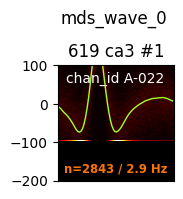

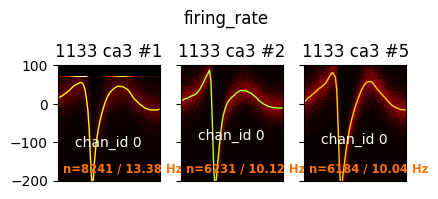

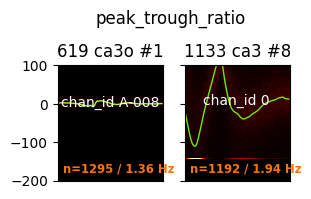

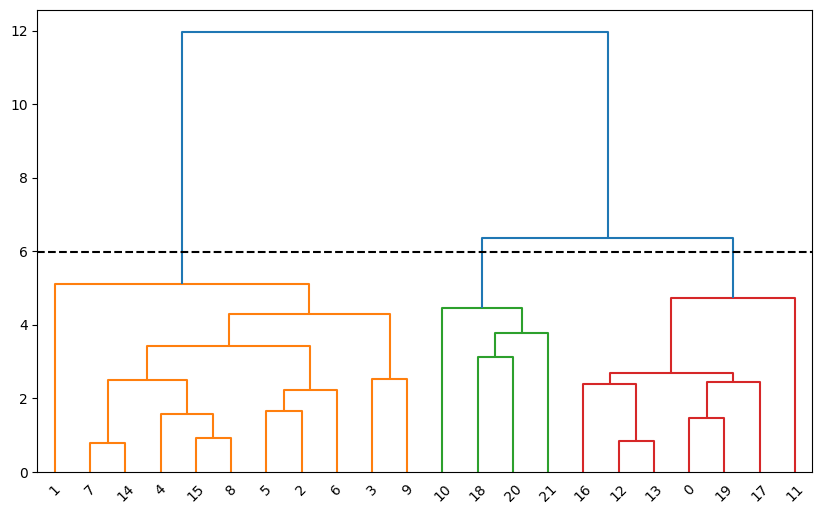

In [11]:
# efe.remove_no_sa_rows()
efe.explode_dataframe()
efe.compute_mds_wave_features()
efe.convert_datatypes()
efe.find_outliers(iqr_mult=3, only_get_cols=['amplitude_median', 'peak_trough_ratio', 'firing_rate', 'half_width'], only_get_cols_substr=['mds_wave_'])
efe.compute_clusters(threshold=0.5, only_get_cols_substr=['amplitude_median', 'peak_trough_ratio', 'firing_rate', 'half_width', 'mds_wave_'])
efe2_df = efe.df_all_units.copy()

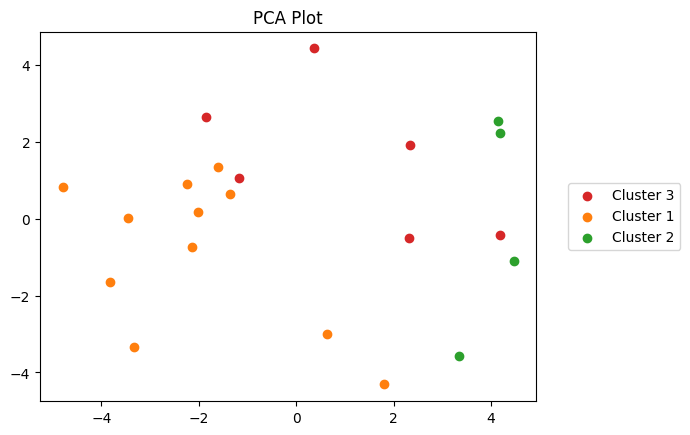

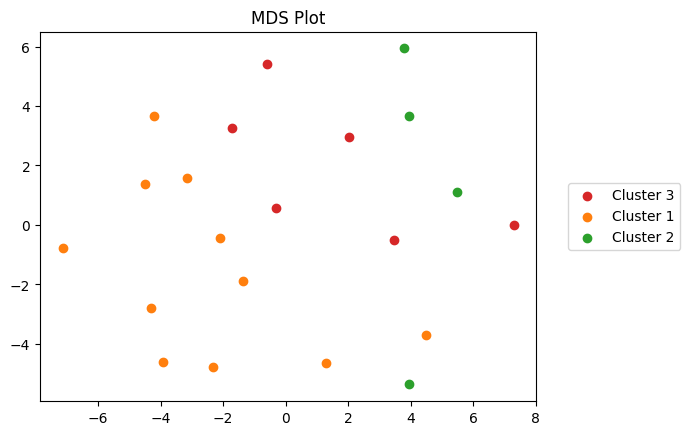

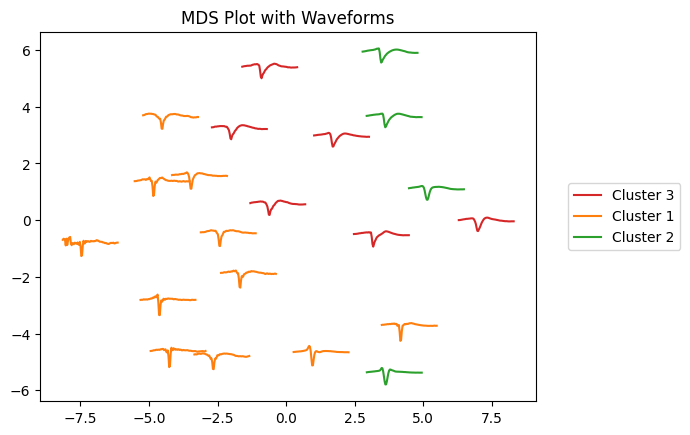

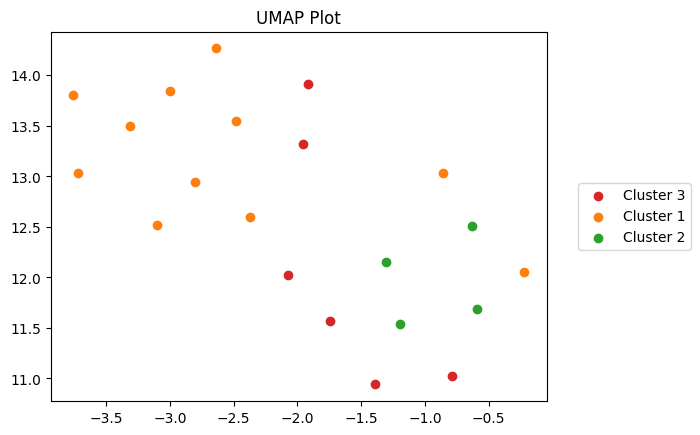

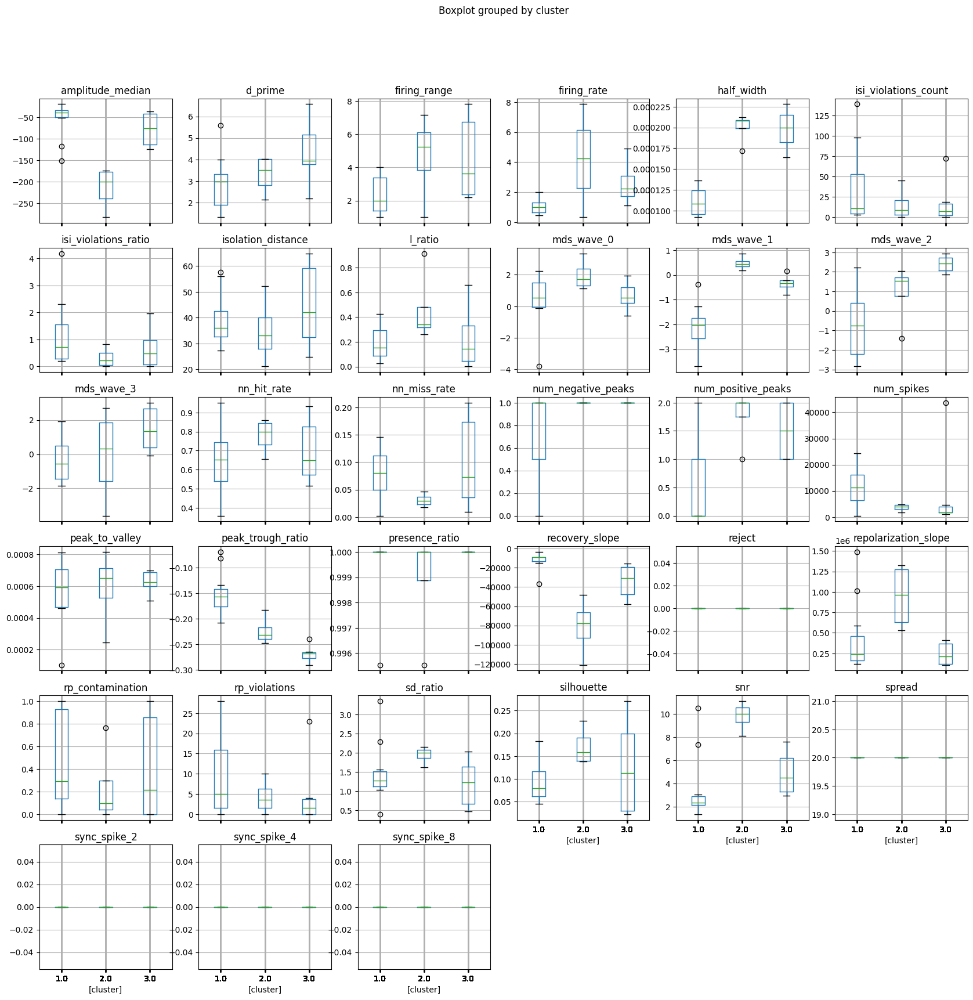

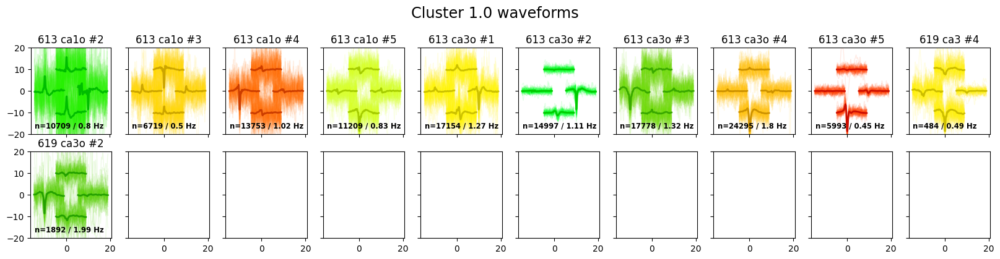

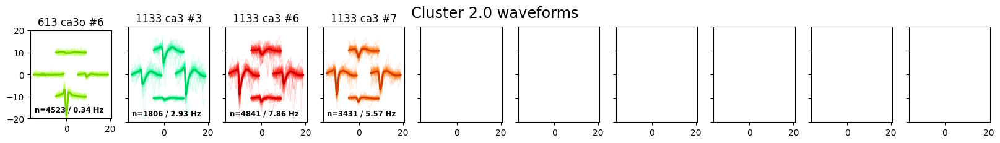

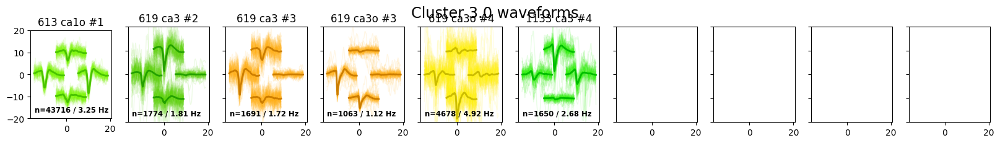

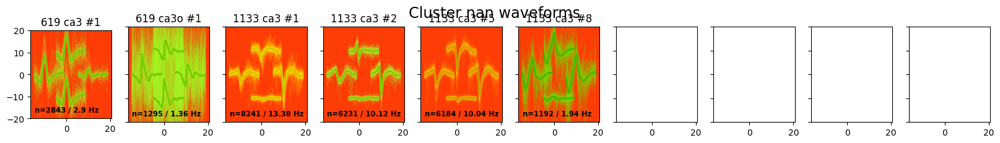

In [12]:
ep = ExperimentPlotter('/mnt/isilon/marsh_single_unit/MarshMountainSort', efe=efe, dsr=dsr)
# display(ep.df_all_units)
# display(efe.df_all_units)

# df_waves = ep.get_df(drop_nan_rows=True, drop_nan_ignorecols=['cluster'], )
# with pd.option_context('display.max_rows', None, 'display.max_columns', None):
#     display(df_waves[df_waves['reject']])

# df_waves = ep.get_df(drop_nan_ignorecols=['cluster'], )
# with pd.option_context('display.max_rows', None, 'display.max_columns', None):
#     display(df_waves[df_waves['reject']])

rs = np.random.default_rng().integers(np.iinfo(np.uint32).max)
ep.plot_pca()
ep.plot_mds(random_state=rs)
ep.plot_mds_waveforms(random_state=rs)
ep.plot_umap(random_state=rs)
ep.plot_feature_boxplots()
ep.plot_cluster_waveforms()

['mds_wave_3', 'num_positive_peaks', 'mds_wave_2', 'mds_wave_0', 'half_width', 'firing_rate', 'peak_to_valley', 'recovery_slope', 'peak_trough_ratio', 'snr', 'amplitude_median', 'num_negative_peaks', 'repolarization_slope', 'mds_wave_1', 'cluster', 'id', 'region', 'best_depth', 'name', 'sa', 'sa_savedir', 'rec_duration', 'n_units', 'unit', 'waveform']
df.shape: (22, 15)
row_colors.shape: (22, 5)


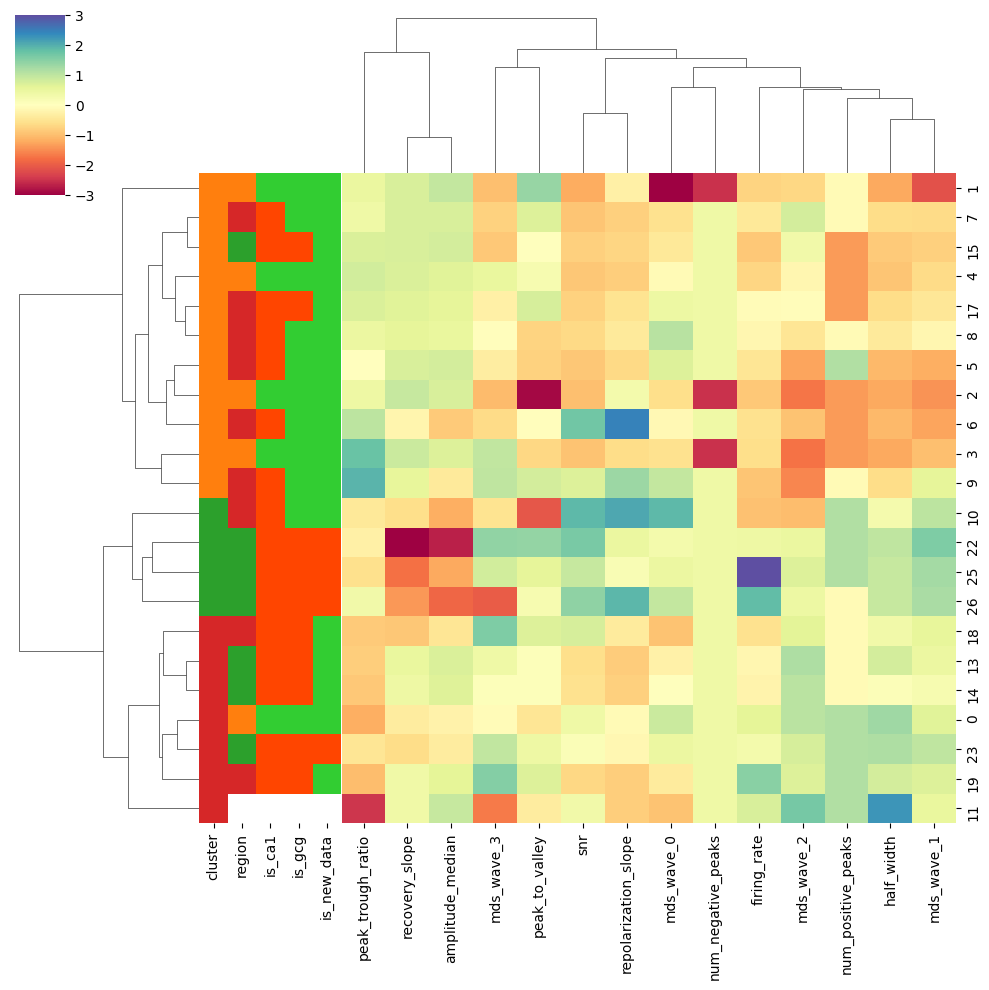

In [13]:
# dftemp = efe.get_df(drop_bad_cols=True).drop(efe.UNIT_UNIQUE_FEATURES, axis=1, errors='ignore')
# dftemp = dftemp[dftemp['cluster'].notna()]
# print(f"dftemp.shape: {dftemp.shape}")
# for col in dftemp.columns:
#     print(f"{col}: {dftemp[col].isna().sum()}")


# allfeats = efe.get_df(only_get_cols_substr=['amplitude_median', 'peak_trough_ratio', 'firing_rate', 'half_width', 'mds_wave_', 'cluster']).columns
allfeats = efe.get_df(
    only_get_cols_substr=[
        'amplitude_median', 'peak_trough_ratio', 'firing_rate', 'firing_rate_range', 'half_width', 
        'peak_to_valley', 'repolarization_slope', 'recovery_slope', 'num_positive_peaks', 'num_negative_peaks',
        'snr', 'mds_wave_', 'cluster'
    ]
).columns
allfeats = allfeats.tolist()
features = allfeats + efe.UNIT_UNIQUE_FEATURES
print(features)
df = efe.get_df(drop_bad_cols=True)[features]
df = df.drop(efe.UNIT_UNIQUE_FEATURES, axis=1, errors='ignore')
df = df.dropna(axis=0)

# df = dftemp # NOTE testing viewing all features
# df = df.fillna(0)

# NOTE Necessary to  drop all zero variance columns, otherwise standard_scale breaks
keepcols = df.std() > 0.0
df = df.loc[:, keepcols.reindex(df.columns, axis=1, fill_value=False)]
print(f"df.shape: {df.shape}")
df = df.astype('float')
row_colors_1 = df['cluster'].apply(lambda x: f'C{int(x)}')

region_to_color = {'ca1s':'C0', 'ca1o':'C1', 'ca3':'C2', 'ca3o':'C3'}
row_colors_2 = efe.get_df(drop_nan_rows=True)['region'].apply(lambda x: region_to_color[x])

row_colors_3 = efe.get_df(drop_nan_rows=True)['region'].apply(lambda x: 'limegreen' if 'ca1' in x else 'orangered')
row_colors_3.name = 'is_ca1'

gcg_ids = [1185, 1236, 1238, 1269, 580, 613]
row_colors_4 = efe.get_df(drop_nan_rows=True)['id'].apply(lambda x: 'limegreen' if x in gcg_ids else 'orangered')
row_colors_4.name = 'is_gcg'

row_colors_5 = efe.get_df(drop_nan_rows=True)['id'].apply(lambda x: 'limegreen' if x < 765 else 'orangered')
row_colors_5.name = 'is_new_data'

row_colors = pd.concat([row_colors_1, row_colors_2, row_colors_3, row_colors_4, row_colors_5], axis=1)
print(f"row_colors.shape: {row_colors.shape}")
# row_colors = [f'C{int(x)}' for x in df['cluster']]
# row_colors = pd.Series(row_colors, name='cluster')
# print(df.shape)
# print(efe.Z_linkage.shape)

# sns.clustermap(df, metric='euclidean', z_score=1)
# sns.clustermap(df, metric='euclidean', row_linkage=efe.Z_linkage)
# sns.clustermap(df, metric='euclidean', z_score=1, row_linkage=efe.Z_linkage, cmap='vlag', center=0)
# sns.clustermap(df, metric='euclidean', standard_scale=1, row_linkage=efe.Z_linkage)
# sns.clustermap(df.drop('cluster', axis=1), standard_scale=1, row_linkage=efe.Z_linkage, row_colors=row_colors, cmap='Spectral', center=0)
sns.clustermap(df.drop('cluster', axis=1).apply(zscore),
               row_linkage=efe.Z_linkage, 
               row_colors=row_colors,
               cmap='Spectral',
               center=0,
               vmin=-3,
               vmax=3,
               ) # REVIEW this might be the final version?
# sns.clustermap(df.drop('cluster', axis=1), standard_scale=1, row_linkage=efe.Z_linkage)
# sns.clustermap(df.drop('cluster', axis=1), z_score=1, row_linkage=efe.Z_linkage, row_colors=row_colors, cmap='vlag', center=0, vmin=-3, vmax=3)


# df_no_out = df[(np.abs(zscore(df)) < 3).all(axis=1)]
# keepcols = df_no_out.std() > 0.0
# df_no_out = df_no_out.loc[:, keepcols.reindex(df_no_out.columns, axis=1, fill_value=False)]
# print(df.index.size, df_no_out.index.size)
# sns.clustermap(df_no_out, metric='euclidean', z_score=1, cmap='vlag', center=0)


In [14]:
df = efe.get_df(drop_nan_rows=True)

df = df.assign(log_firing_rate=np.log10(df['firing_rate'], dtype=np.float32))


# aggregate from small n into big N and do the same plots
# df = df.drop(['name', 'sa'], axis=1)
# df = df.groupby(['id', 'region']).mean().reset_index() # NOTE this converts from small n to big N

df = df.assign(is_new_data=(df['id'] < 765))
df = df.assign(is_gcg=(df['id'].isin([1185, 1236, 1238, 1269, 580, 613]))) # NOTE really hacky but works for now
df = df.assign(is_ca1=(df['region'].isin(['ca1', 'ca1o']))) # NOTE really hacky but works for now
# df = df.loc[df['is_new_data']]

interesting_feats = ['firing_rate', 'log_firing_rate', 'half_width', 'repolarization_slope', 'recovery_slope', 'peak_to_valley', 'amplitude_median']


[(('ca1o', False), ('ca1o', True)), (('ca3o', False), ('ca3o', True)), (('ca3', False), ('ca3', True))]
ca3o_False vs. ca3o_True: t-test independent samples, P_val:8.911e-02 t=1.973e+00
ca1o_False vs. ca1o_True: t-test independent samples, P_val:nan t=nan
ca3_False vs. ca3_True: t-test independent samples, P_val:nan t=nan


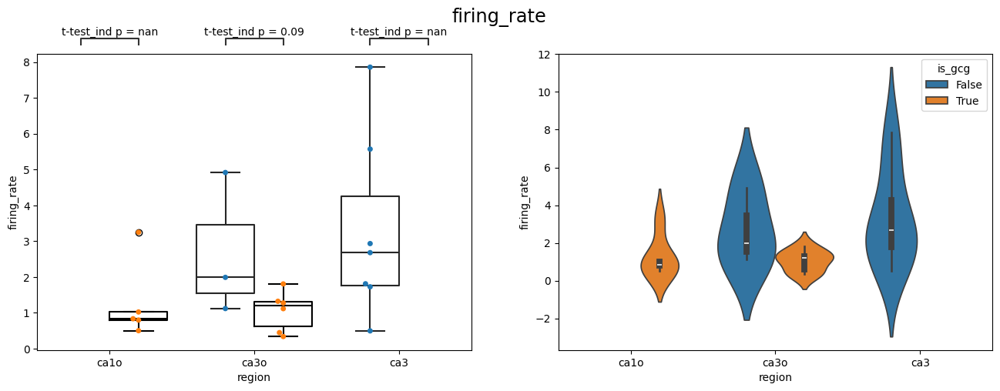

[(('ca1o', False), ('ca1o', True)), (('ca3o', False), ('ca3o', True)), (('ca3', False), ('ca3', True))]
ca3o_False vs. ca3o_True: t-test independent samples, P_val:1.063e-01 t=1.853e+00
ca1o_False vs. ca1o_True: t-test independent samples, P_val:nan t=nan
ca3_False vs. ca3_True: t-test independent samples, P_val:nan t=nan


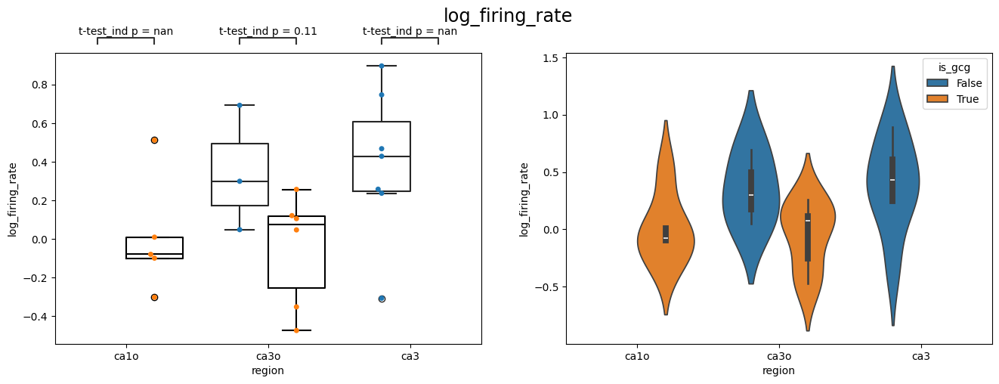

[(('ca1o', False), ('ca1o', True)), (('ca3o', False), ('ca3o', True)), (('ca3', False), ('ca3', True))]
ca3o_False vs. ca3o_True: t-test independent samples, P_val:1.031e-01 t=1.874e+00
ca1o_False vs. ca1o_True: t-test independent samples, P_val:nan t=nan
ca3_False vs. ca3_True: t-test independent samples, P_val:nan t=nan


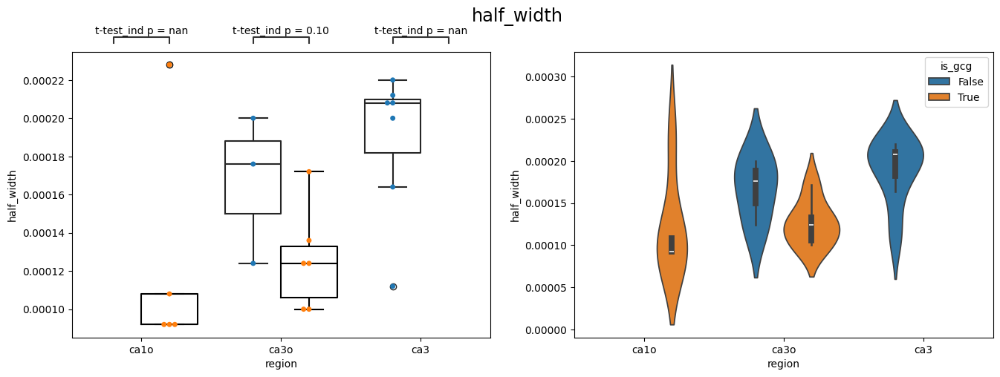

[(('ca1o', False), ('ca1o', True)), (('ca3o', False), ('ca3o', True)), (('ca3', False), ('ca3', True))]
ca3o_False vs. ca3o_True: t-test independent samples, P_val:2.034e-01 t=-1.403e+00
ca1o_False vs. ca1o_True: t-test independent samples, P_val:nan t=nan
ca3_False vs. ca3_True: t-test independent samples, P_val:nan t=nan


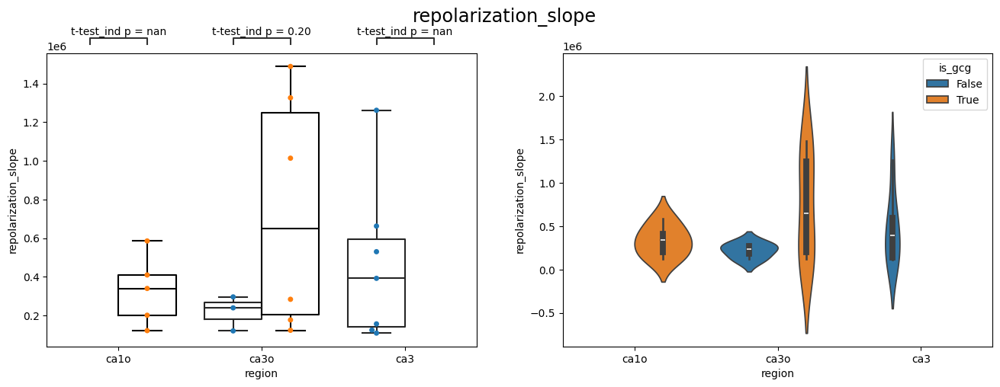

[(('ca1o', False), ('ca1o', True)), (('ca3o', False), ('ca3o', True)), (('ca3', False), ('ca3', True))]
ca3o_False vs. ca3o_True: t-test independent samples, P_val:5.707e-01 t=-5.948e-01
ca1o_False vs. ca1o_True: t-test independent samples, P_val:nan t=nan
ca3_False vs. ca3_True: t-test independent samples, P_val:nan t=nan


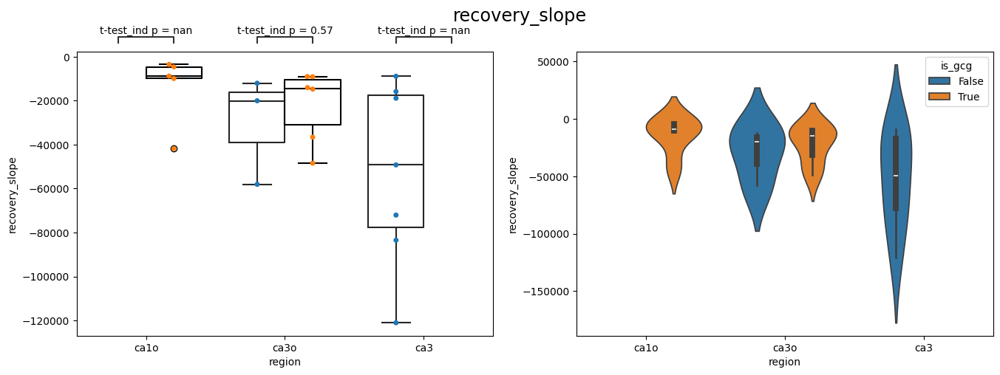

[(('ca1o', False), ('ca1o', True)), (('ca3o', False), ('ca3o', True)), (('ca3', False), ('ca3', True))]
ca3o_False vs. ca3o_True: t-test independent samples, P_val:1.393e-01 t=1.668e+00
ca1o_False vs. ca1o_True: t-test independent samples, P_val:nan t=nan
ca3_False vs. ca3_True: t-test independent samples, P_val:nan t=nan


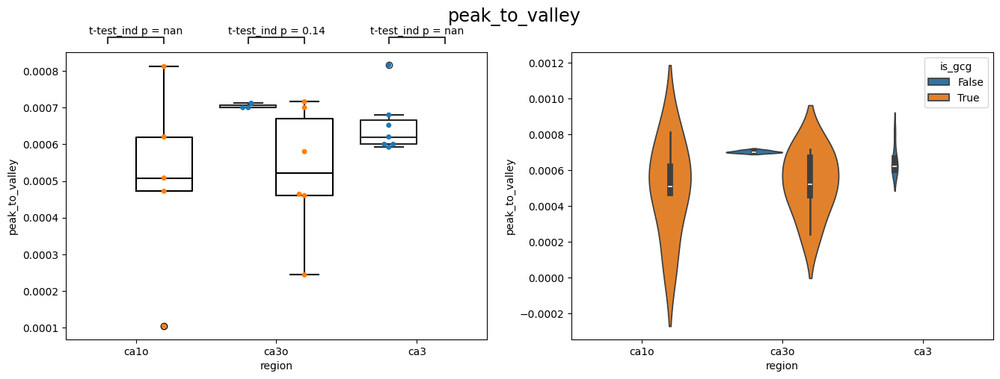

[(('ca1o', False), ('ca1o', True)), (('ca3o', False), ('ca3o', True)), (('ca3', False), ('ca3', True))]
ca3o_False vs. ca3o_True: t-test independent samples, P_val:6.161e-01 t=5.245e-01
ca1o_False vs. ca1o_True: t-test independent samples, P_val:nan t=nan
ca3_False vs. ca3_True: t-test independent samples, P_val:nan t=nan


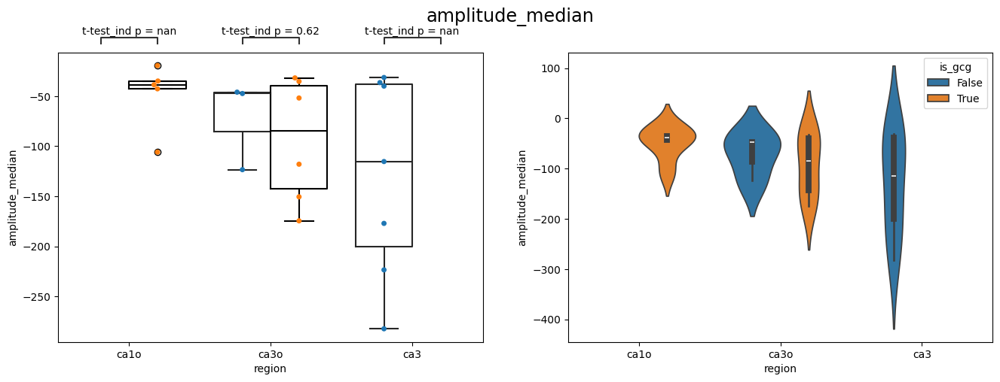

In [15]:
# SECTION plot boxplots and violinplots
# firing_rate, log_firing_rate, half_width, repolarization_slope, recovery_slope, peak_to_valley, region, n_units, is_gcg, is_new_data
hue = 'is_gcg'
# hue = 'is_new_data'
for tempfeat in interesting_feats:
    fig, axes = plt.subplots(1, 2, figsize=(16, 5))
    
    sns.boxplot(data=df, x='region', hue=hue, y=tempfeat, ax=axes[0], fill=False, saturation=0, palette='dark:black', legend=False)
    sns.swarmplot(data=df, x='region', hue=hue, y=tempfeat, ax=axes[0], dodge=True, legend=False)
    
    sns.violinplot(data=df, x='region', hue=hue, y=tempfeat, ax=axes[1])

    pairs = [((x, False), (x, True)) for x in df['region'].unique()]
    print(pairs)
    annotator = Annotator(ax=axes[0], pairs=pairs,
                          data=df, x='region', hue=hue, y=tempfeat)
    annotator.configure(test='t-test_ind', text_format='simple', loc='outside')
    annotator.apply_and_annotate()
    fig.suptitle(tempfeat, y=1, fontsize='xx-large')
    plt.show()


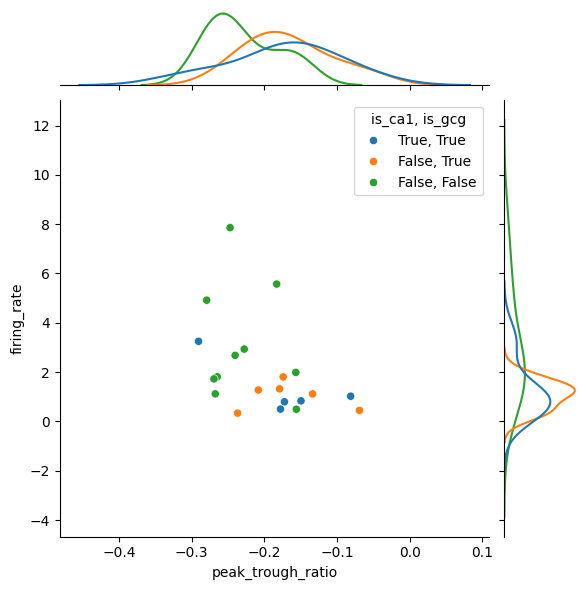

In [16]:
# SECTION plot one jointgrid
jointgrid_hue = df[['is_ca1', 'is_gcg']].apply(lambda x: f"{x.iloc[0]}, {x.iloc[1]}", axis=1)
jointgrid_hue.name = 'is_ca1, is_gcg'
g = sns.JointGrid(data=df, x='peak_trough_ratio', y='firing_rate', hue=jointgrid_hue)
g.plot_joint(sns.scatterplot)
g.plot_marginals(sns.kdeplot, common_norm=False)


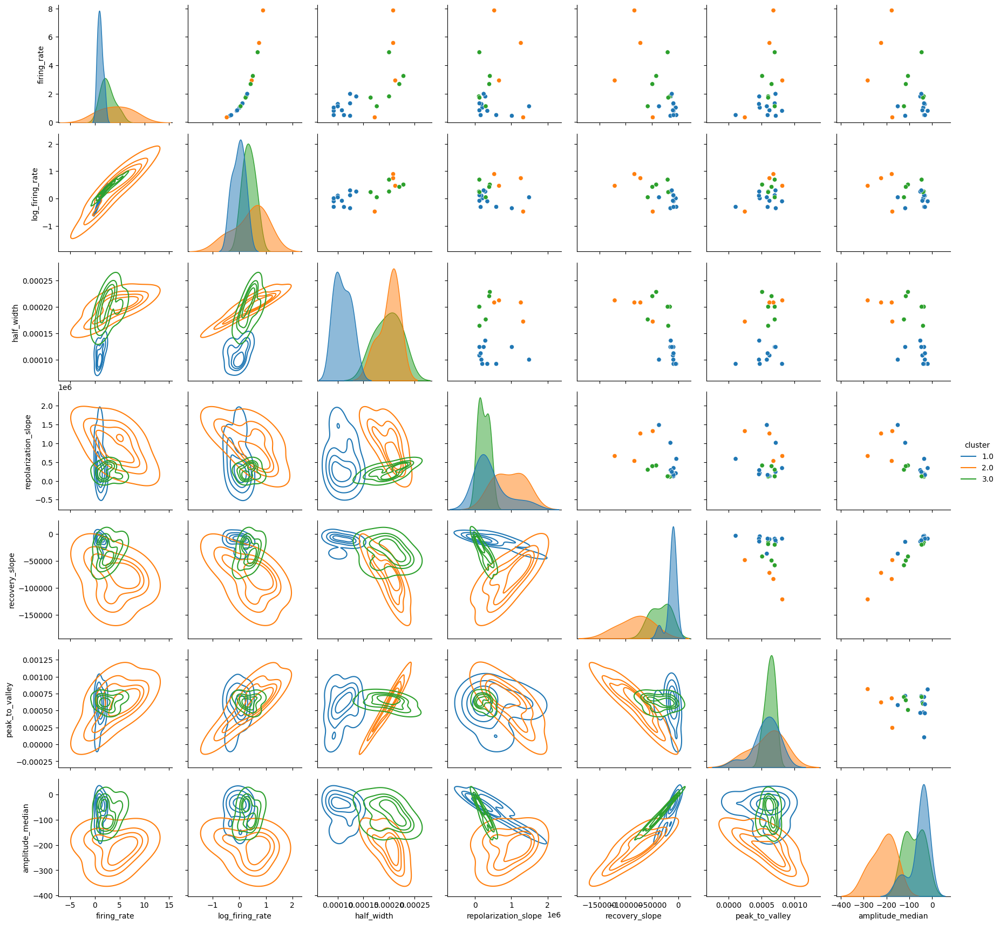

In [17]:
# SECTION plot big pairgrid (compare all possible 2-feature scatterplots)

pairgrid_hue, palette = 'cluster', 'tab10'
# pairgrid_hue, palette = 'num_positive_peaks', 'flare'

pairgrid_feats = interesting_feats + [pairgrid_hue]
df_pairgrid = df[pairgrid_feats]
# df_pairgrid = df[['firing_rate', 'half_width', 'repolarization_slope', 'recovery_slope', 'peak_trough_ratio']]
# palette = Spectral, crest, flare, tab10
p = sns.PairGrid(data=df_pairgrid, hue=pairgrid_hue, diag_sharey=False, palette=palette)
p.map_diag(sns.kdeplot, common_norm=False, fill=True, alpha=0.5)
p.map_upper(sns.scatterplot)
p.map_lower(sns.kdeplot, common_norm=False, levels=5)
# p.map(sns.kdeplot)
p.add_legend()


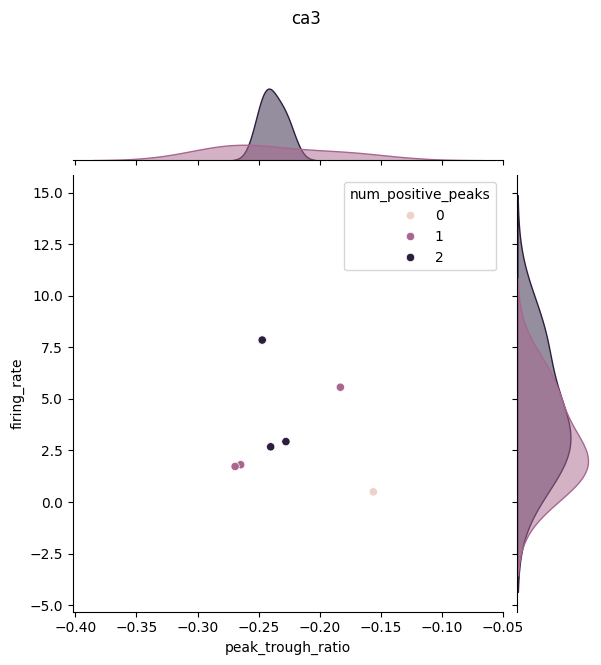

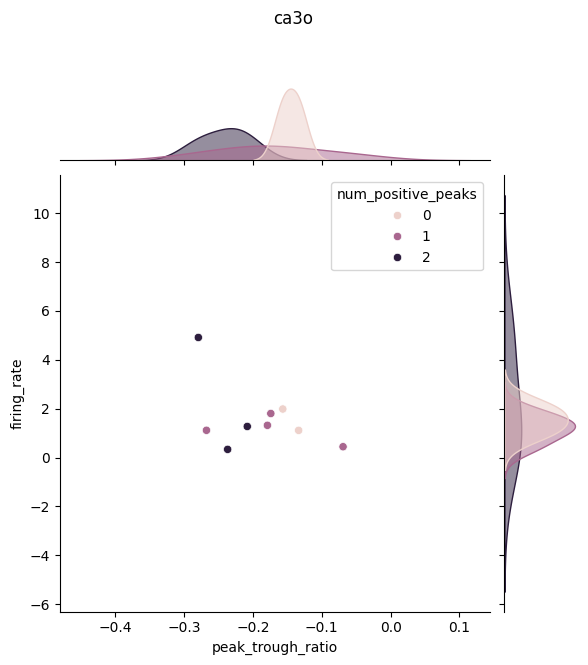

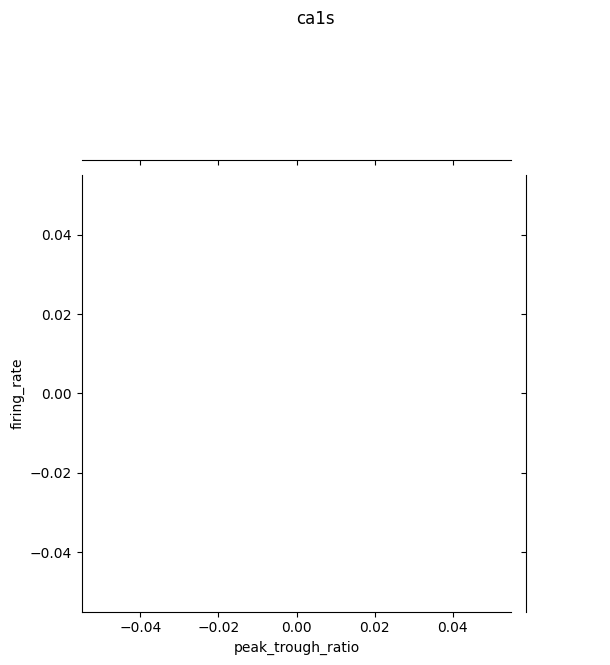

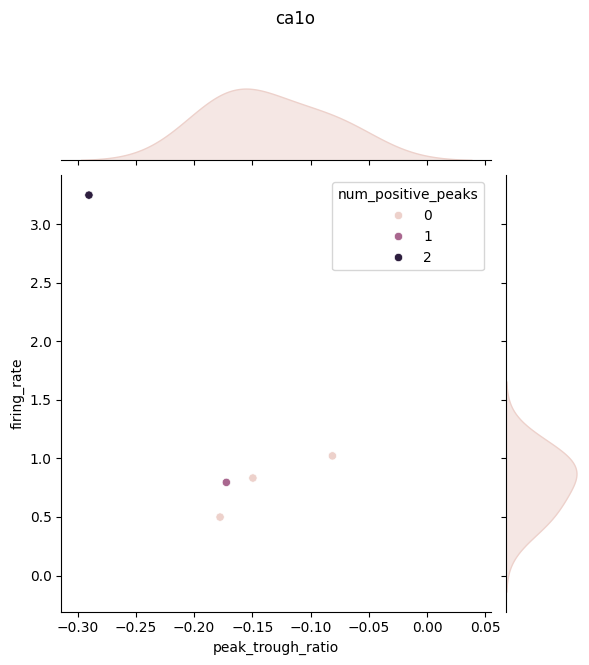

In [18]:
# SECTION plot many jointgrids
for region in constants.REGIONS:
    df_plot = df.loc[df['region'] == region]
    # g = sns.JointGrid(data=df_plot, x='repolarization_slope', y='recovery_slope', hue='n_units')
    # g = sns.JointGrid(data=df_plot, x='amplitude_median', y='peak_trough_ratio', hue='is_gcg')
    # g = sns.JointGrid(data=df_plot, x='peak_trough_ratio', y='firing_rate', hue='is_gcg')
    g = sns.JointGrid(data=df_plot, x='peak_trough_ratio', y='firing_rate', hue='num_positive_peaks')
    # g = sns.JointGrid(data=df_plot, x='firing_rate', y=tempfeat, hue='n_units')
    # g = sns.JointGrid(data=df, x='mds_wave_1', y='mds_wave_2', hue='n_units')

    # g.ax_joint.set_xscale('symlog', linthresh=0.1)
    # g.ax_joint.set_xlim(left=-10000, right=-1)
    # g.ax_marg_x.set_xscale('symlog', linthresh=0.1)
    # g.ax_marg_x.set_xlim(left=-10000, right=-1)
    
    g.plot_joint(sns.scatterplot)
    # g.plot_joint(sns.kdeplot)

    # g.plot_marginals(sns.kdeplot)
    # g.plot_marginals(sns.kdeplot, cumulative=True, common_norm=False, palette='crest')
    g.plot_marginals(sns.kdeplot, fill=True, common_norm=False, alpha=0.5)
    # g.plot_marginals(sns.histplot, multiple='stack')
    # g.plot_marginals(sns.histplot, element='step')
    # g.plot_marginals(sns.histplot, element='poly')
    # g.plot_marginals(sns.histplot, element='poly', stat='density', common_norm=False)
    # g.plot_marginals(sns.histplot, element='step', fill=False, cumulative=True, stat='density', common_norm=False)
    
    
    g.figure.suptitle(region, y=1.1)

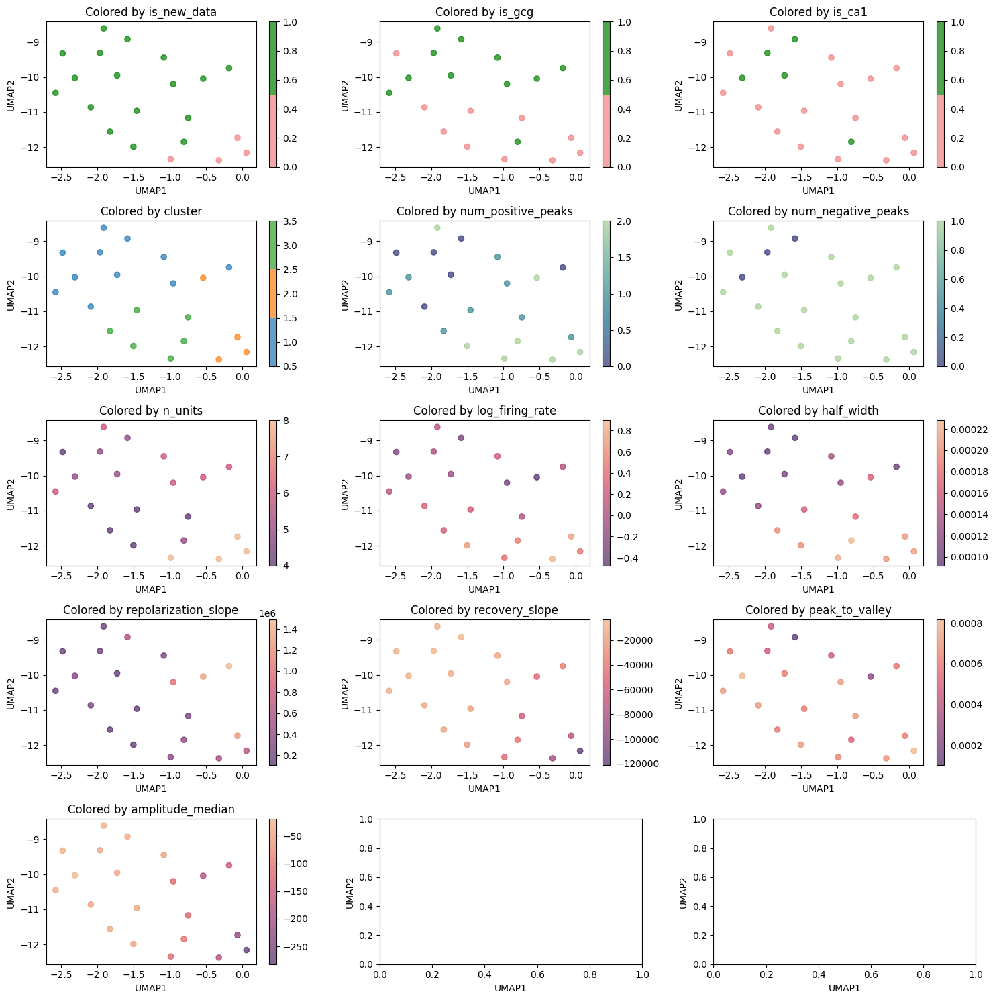

In [19]:
# Features to use for UMAP
umap_features = [feat for feat in interesting_feats if feat != 'firing_rate']

# Prepare data for UMAP
X = df[umap_features].values
# Scale the features
X_scaled = StandardScaler().fit_transform(X)

# Fit UMAP
umap_2d = umap.UMAP(n_components=2)
umap_embedding = umap_2d.fit_transform(X_scaled)

# Create figure with multiple subplots
fig, axes = plt.subplots(5, 3, figsize=(15, 15))
axes = axes.ravel()

# Define plot configurations
plot_configs = [
    # Binary features with consistent coloring
    *[{
        'column': col,
        'cmap': matplotlib.colors.ListedColormap(['lightcoral', 'green']),
        'norm': matplotlib.colors.Normalize(vmin=0, vmax=1),
        'astype': int
    } for col in ['is_new_data', 'is_gcg', 'is_ca1']],
    {
        'column': 'cluster',
        'title': 'cluster',
        'cmap': matplotlib.colors.ListedColormap(plt.cm.tab10.colors[:len(df['cluster'].unique())]),
        'norm': matplotlib.colors.Normalize(vmin=0.5, vmax=len(df['cluster'].unique()) + 0.5),
        'astype': None
    },
    *[{
        'column': col,
        'cmap': 'crest_r',
        'norm': None,
        'astype': None
    } for col in ['num_positive_peaks', 'num_negative_peaks']],
] + [
    {
        'column': feat,
        'cmap': 'flare_r',
        'norm': None,
        'astype': None
    }
    for feat in ['n_units'] + umap_features
]

# Create plots
for i, config in enumerate(plot_configs):
    color_data = df[config['column']]
    if config['astype'] is not None:
        color_data = color_data.astype(config['astype'])
        
    scatter = axes[i].scatter(umap_embedding[:, 0], umap_embedding[:, 1],
                            c=color_data,
                            cmap=config['cmap'],
                            norm=config['norm'],
                            alpha=0.7)
    axes[i].set_title(f"Colored by {config['column']}")
    plt.colorbar(scatter, ax=axes[i])


# Add labels and adjust layout
for ax in axes:
    ax.set_xlabel('UMAP1')
    ax.set_ylabel('UMAP2')

plt.tight_layout()
plt.show()


In [20]:
def load_mne_raw(sortfolder_path:Path, region:str, sortdir_name:str='sortings', rawrecdir_name:str='recordings-raw',
                 f_s:int=200, chunk_len:int=60, trim_max_chunks:int=None):
    
    sortfolder_path = Path(sortfolder_path)
    subfolder_name = sortfolder_path.name
    rawfolderpath = sortfolder_path.parent.parent / rawrecdir_name / subfolder_name
    if sortdir_name is not None:
        sortfolder_path = sortfolder_path.parent.parent / sortdir_name / subfolder_name

    sa = core.AnimalSortLoader.load_sortinganalyzer(sortfolder_path, region=region)
    sort = sa.sorting
    if sort is None:
        raise Exception(f"No sorting found for {sortfolder_path}")
    
    rec = core.AnimalRawRecordingLoader.load_recording(rawfolderpath, region=region)
    if rec is None:
        raise Exception(f"No recording found for {sortfolder_path}")
    rec = spre.resample(rec, int(sa.sampling_frequency))

    sa = si.create_sorting_analyzer(sorting=sort, 
                                    recording=rec, 
                                    format='memory',
                                    sparse=False
                                    )
    return convert_sa_to_mne(sa, f_s=f_s, chunk_len=chunk_len, trim_max_chunks=trim_max_chunks)


def convert_sa_to_mne(sa: si.SortingAnalyzer, f_s=200, chunk_len=60, trim_max_chunks:int=None):
    rec = sa.recording
    rec = spre.resample(rec, f_s)
    traces = []
    n_chunks = int(rec.get_duration()) // chunk_len
    n_chunks = min(trim_max_chunks, n_chunks) if trim_max_chunks is not None else n_chunks
    for j in range(n_chunks): # NOTE last trace will be dropped, i.e. last <60 seconds
        traces.append(rec.get_traces(start_frame=j * chunk_len * rec.get_sampling_frequency(), 
                                     end_frame=(j + 1) * chunk_len * rec.get_sampling_frequency(),
                                     return_scaled=True))
    traces = np.concatenate(traces, axis=0)
    traces = traces.T
    traces *= 1e-6 # convert from uV to V

    # Extract spike times for each unit and create annotations
    onset = []
    description = []
    for unit_id in sa.sorting.get_unit_ids():
        spike_train = sa.sorting.get_unit_spike_train(unit_id)
        # Convert to seconds and filter to recording duration
        spike_times = spike_train / sa.sorting.get_sampling_frequency()
        mask = spike_times < rec.get_duration()
        spike_times = spike_times[mask]
        
        # Create annotation for each spike
        onset.extend(spike_times)
        description.extend([f'unit_{unit_id}'] * len(spike_times))
    annotations = mne.Annotations(onset, duration=0, description=description)
    raw = mne.io.RawArray(data=traces, 
                          info=mne.create_info(ch_names=rec.channel_ids.astype(str).tolist(), sfreq=rec.get_sampling_frequency(), ch_types='eeg'))
    raw.set_annotations(annotations)

    return raw



In [21]:
# sa_gcg1 = df.copy()
# sa_gcg1 = df.replace({np.nan : None})
# # sa_gcg1 = sa_gcg1[~sa_gcg1['id'].isin([619, 613])]
# sa_gcg1 = sa_gcg1.drop_duplicates(subset=['id', 'region'])
# display(sa_gcg1)

testmnes = ["/mnt/isilon/marsh_single_unit/MarshMountainSort/sortings/613-WT-GCG-M-20htL-20htR tetrodes 1-29-25_250129_092654",
            "/mnt/isilon/marsh_single_unit/MarshMountainSort/sortings/613-WT-GCG-M-20htL-20htR tetrodes 1-29-25_250129_092654",
            "/mnt/isilon/marsh_single_unit/MarshMountainSort/sortings/619-WT-GCG-M-18htL-18htR tetrodes after handling 1-28-25_250128_113333",
            "/mnt/isilon/marsh_single_unit/MarshMountainSort/sortings/619-WT-GCG-M-15htL-15htR tetrodes 1-26-25_250126_134403",
            "/mnt/isilon/marsh_single_unit/MarshMountainSort/sortings/1133_WT_6 half turns_right after turning_01-25-17"]
regions = ['ca1o', 'ca3o', 'ca3', 'ca3o', 'ca3']
testmnes = pd.DataFrame({'folders': testmnes, 'region': regions})

def load_mne_for_row(row):
    # sortfolder_path = DepthSheetReader.get_row_from_depth_df(identifier=row['id'],
    #                                                     region=row['region'],
    #                                                     depth=row['best_depth'],
    #                                                     name=row['name']).folder
    # print(sortfolder_path)
    # return
    raw = load_mne_raw(row['folders'], row['region'], trim_max_chunks=30)
    return raw

testmnes['mne'] = testmnes.apply(load_mne_for_row, axis=1)

Creating RawArray with float64 data, n_channels=4, n_times=360000
    Range : 0 ... 359999 =      0.000 ...  1799.995 secs
Ready.
Creating RawArray with float64 data, n_channels=4, n_times=360000
    Range : 0 ... 359999 =      0.000 ...  1799.995 secs
Ready.
Creating RawArray with float64 data, n_channels=4, n_times=192000
    Range : 0 ... 191999 =      0.000 ...   959.995 secs
Ready.
Creating RawArray with float64 data, n_channels=4, n_times=180000
    Range : 0 ... 179999 =      0.000 ...   899.995 secs
Ready.
Creating RawArray with float64 data, n_channels=4, n_times=120000
    Range : 0 ... 119999 =      0.000 ...   599.995 secs
Ready.


Used Annotations descriptions: ['unit_1', 'unit_2', 'unit_3', 'unit_4', 'unit_5']
Used Annotations descriptions: ['unit_1', 'unit_2', 'unit_3', 'unit_4', 'unit_5']


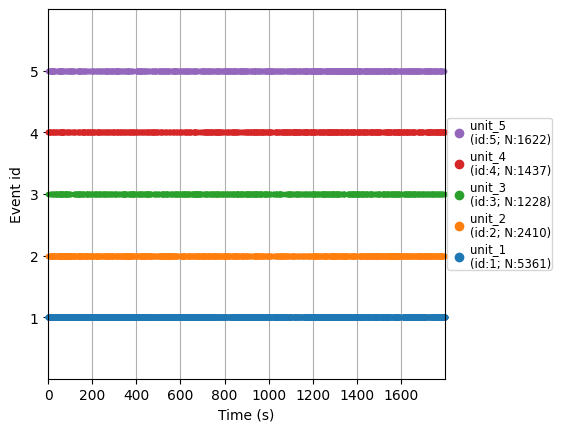

Used Annotations descriptions: ['unit_1', 'unit_2', 'unit_3', 'unit_4', 'unit_5', 'unit_6']
Used Annotations descriptions: ['unit_1', 'unit_2', 'unit_3', 'unit_4', 'unit_5', 'unit_6']


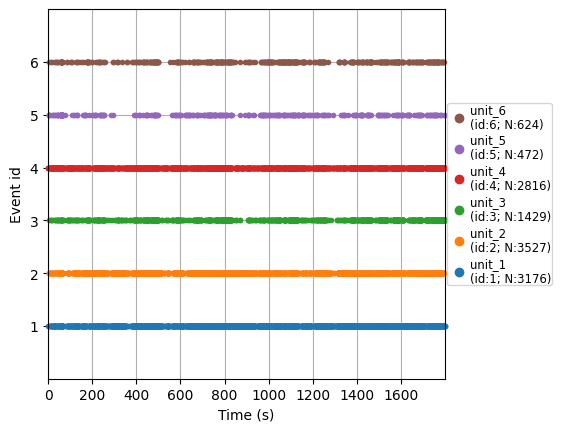

Used Annotations descriptions: ['unit_1', 'unit_2', 'unit_3', 'unit_4']
Used Annotations descriptions: ['unit_1', 'unit_2', 'unit_3', 'unit_4']


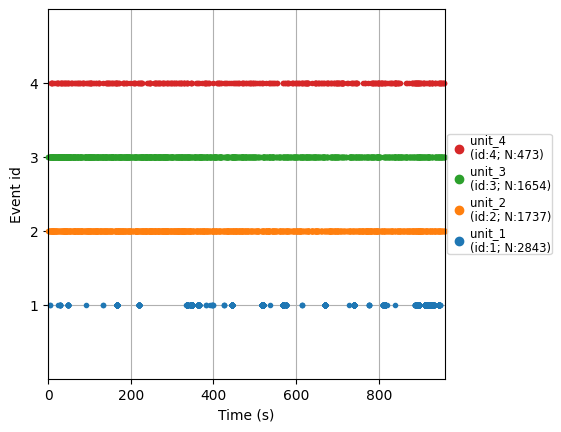

Used Annotations descriptions: ['unit_1', 'unit_2', 'unit_3', 'unit_4']
Used Annotations descriptions: ['unit_1', 'unit_2', 'unit_3', 'unit_4']


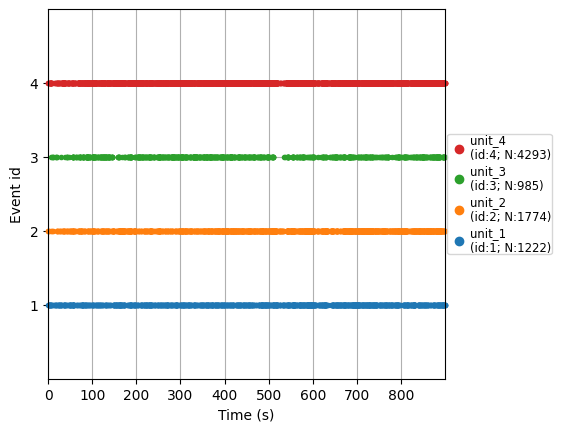

Used Annotations descriptions: ['unit_1', 'unit_2', 'unit_3', 'unit_4', 'unit_5', 'unit_6', 'unit_7', 'unit_8']
Used Annotations descriptions: ['unit_1', 'unit_2', 'unit_3', 'unit_4', 'unit_5', 'unit_6', 'unit_7', 'unit_8']


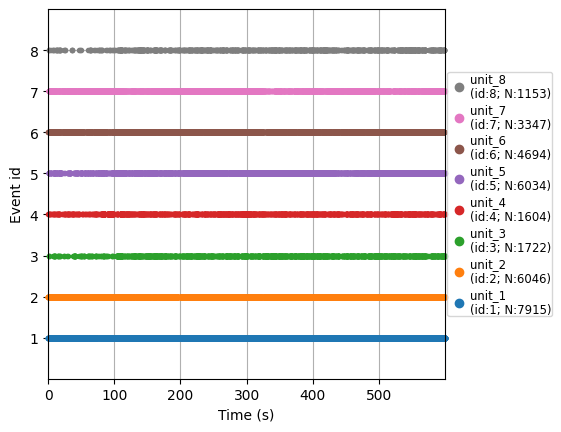

In [22]:
# Plot events as raster using MNE
for i, row in testmnes.iterrows():
    raw = row['mne']
    fig = mne.viz.plot_events(mne.events_from_annotations(raw=raw)[0],
                              sfreq=raw.info['sfreq'],
                              first_samp=raw.first_samp,
                              event_id=mne.events_from_annotations(raw=raw)[1])
    plt.show()


In [23]:
def random_subsample_epochs(epochs, max_epochs=1000):
    if len(epochs) > max_epochs:
        # Get random indices for subsampling
        indices = np.random.choice(len(epochs), size=max_epochs, replace=False)
        epochs = epochs[indices]
    return epochs

In [26]:
# REVIEW since there isn't a good way to divide spike power by a random sample, 
# I'm doing it manually here

# tfr_spike.get_data().mean(axis=0).shape

def plot_tfr_ratio(tfr_spike: mne.time_frequency.EpochsTFR, 
                   tfr_baseline: mne.time_frequency.EpochsTFR):    
    pow_baseline = np.mean(tfr_baseline.get_data(), axis=(0, 2))
    pow_baseline = pow_baseline[:, np.newaxis]
    pow_spike, plot_t, plot_f = tfr_spike.get_data(return_times=True, return_freqs=True)
    pow_spike = np.mean(pow_spike, axis=0)
    pow_ratio = pow_spike / pow_baseline
    pow_ratio.shape
    fig, ax = plt.subplots(1, 1, figsize=(7, 4))
    ax.imshow(pow_ratio, aspect='auto',
            extent=[plot_t[0], plot_t[-1], plot_f[0], plot_f[-1]],
            origin='lower',
            cmap=plt.cm.RdBu_r,  # Red-Blue diverging colormap
            norm=colors.TwoSlopeNorm(vmin=0.5, vcenter=1, vmax=10))  # Split at 1
    ax.set_xlabel('Time (s)')
    ax.set_ylabel('Frequency (Hz)')
    ax.axvline(0, color='black', linestyle='--')
    plt.colorbar(ax.images[0], ax=ax, label='Power Ratio (spike/baseline)')
    plt.show()


Event IDs: {'unit_1': 1, 'unit_2': 2, 'unit_3': 3, 'unit_4': 4, 'unit_5': 5}
<Epochs | 5294 events (all good), -0.5 – 0.5 s (baseline -10 – -5 s (baseline period was cropped after baseline correction)), ~32.5 MiB, data loaded,
 'unit_1': 5294>


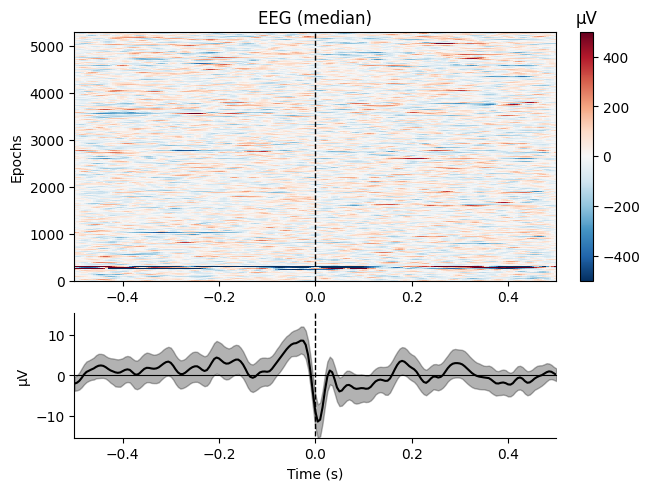

<Epochs | 1000 events (all good), -10 – 10 s (baseline off), ~122.1 MiB, data loaded,
 'unit_3': 94
 'unit_4': 121
 'unit_2': 197
 'unit_5': 156
 'unit_1': 432>
<Epochs | 89 events (all good), -10 – 10 s (baseline off), ~10.9 MiB, data loaded,
 '1': 89>
computing tfr


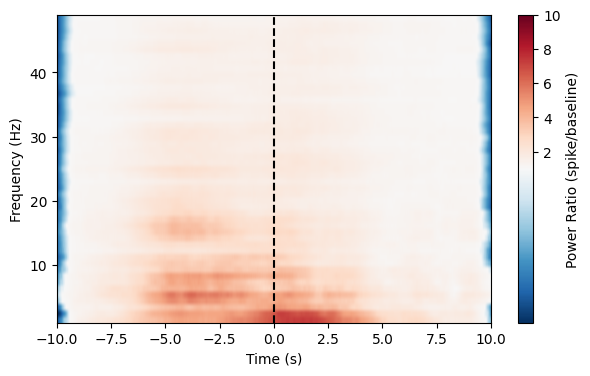

<Epochs | 2294 events (all good), -0.5 – 0.5 s (baseline -10 – -5 s (baseline period was cropped after baseline correction)), ~14.1 MiB, data loaded,
 'unit_2': 2294>


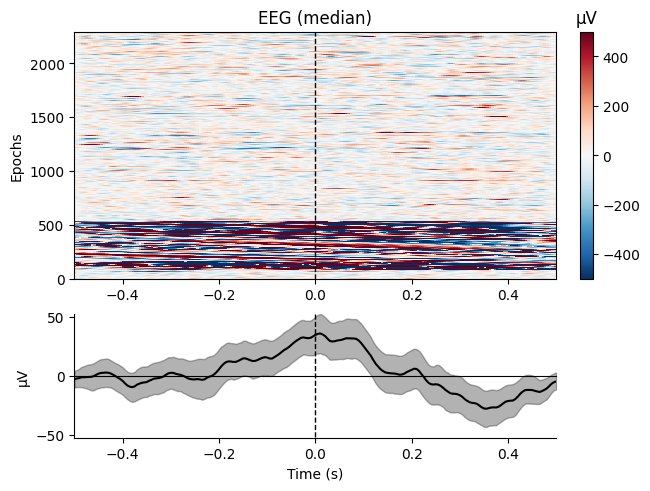

<Epochs | 1000 events (all good), -10 – 10 s (baseline off), ~122.1 MiB, data loaded,
 'unit_3': 95
 'unit_4': 123
 'unit_2': 195
 'unit_5': 139
 'unit_1': 448>
<Epochs | 89 events (all good), -10 – 10 s (baseline off), ~10.9 MiB, data loaded,
 '1': 89>
computing tfr


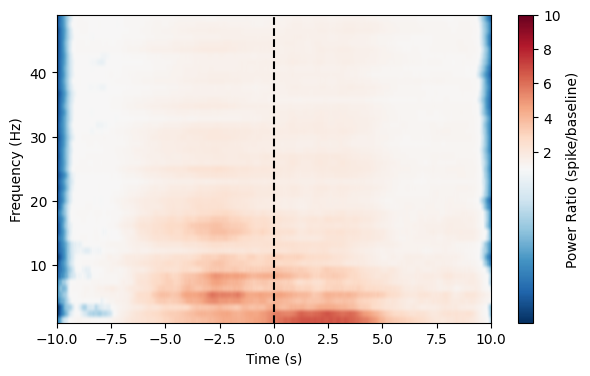

<Epochs | 1223 events (all good), -0.5 – 0.5 s (baseline -10 – -5 s (baseline period was cropped after baseline correction)), ~7.5 MiB, data loaded,
 'unit_3': 1223>


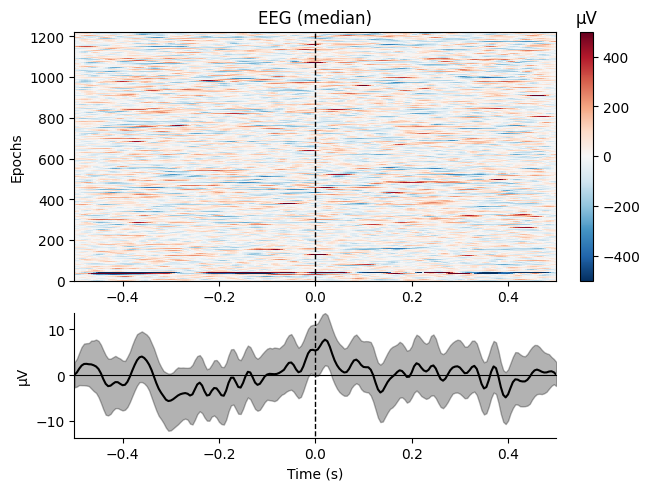

<Epochs | 1000 events (all good), -10 – 10 s (baseline off), ~122.1 MiB, data loaded,
 'unit_3': 109
 'unit_4': 114
 'unit_2': 180
 'unit_5': 151
 'unit_1': 446>
<Epochs | 89 events (all good), -10 – 10 s (baseline off), ~10.9 MiB, data loaded,
 '1': 89>
computing tfr


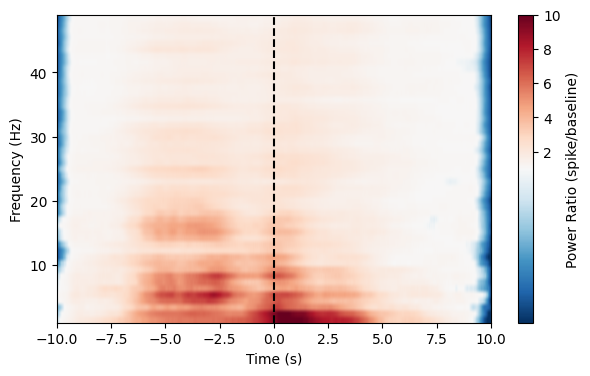

<Epochs | 1425 events (all good), -0.5 – 0.5 s (baseline -10 – -5 s (baseline period was cropped after baseline correction)), ~8.7 MiB, data loaded,
 'unit_4': 1425>


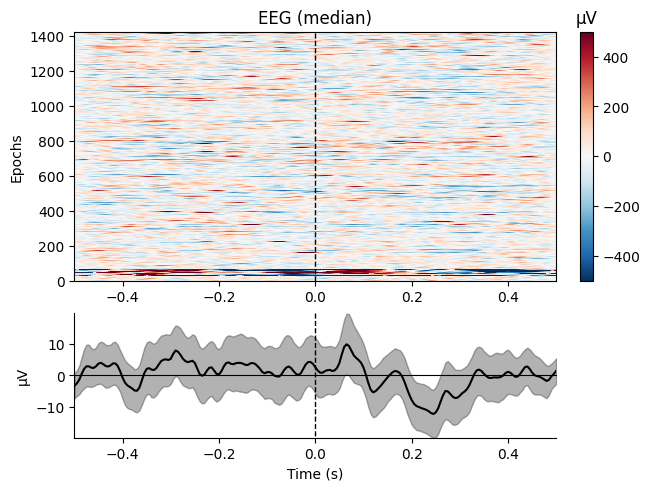

<Epochs | 1000 events (all good), -10 – 10 s (baseline off), ~122.1 MiB, data loaded,
 'unit_3': 102
 'unit_4': 140
 'unit_2': 205
 'unit_5': 136
 'unit_1': 417>
<Epochs | 89 events (all good), -10 – 10 s (baseline off), ~10.9 MiB, data loaded,
 '1': 89>
computing tfr


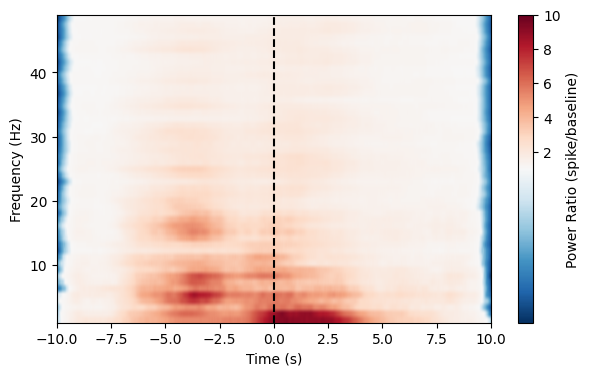

<Epochs | 1610 events (all good), -0.5 – 0.5 s (baseline -10 – -5 s (baseline period was cropped after baseline correction)), ~9.9 MiB, data loaded,
 'unit_5': 1610>


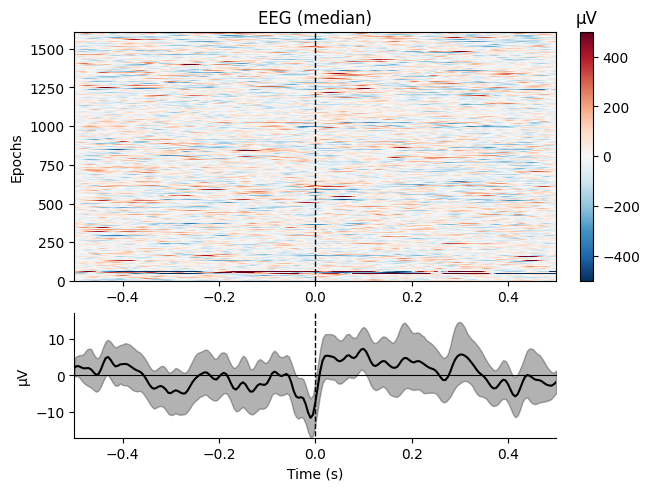

<Epochs | 1000 events (all good), -10 – 10 s (baseline off), ~122.1 MiB, data loaded,
 'unit_3': 103
 'unit_4': 101
 'unit_2': 206
 'unit_5': 131
 'unit_1': 459>
<Epochs | 89 events (all good), -10 – 10 s (baseline off), ~10.9 MiB, data loaded,
 '1': 89>
computing tfr


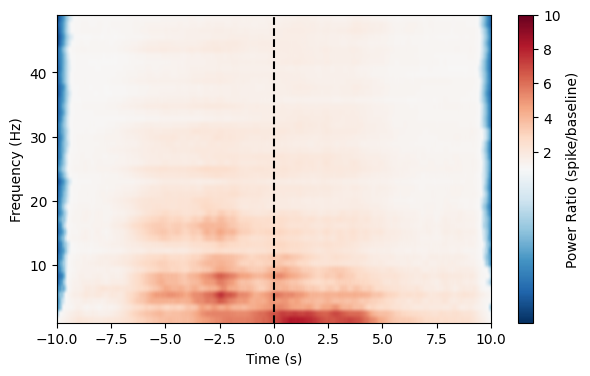

Event IDs: {'unit_1': 1, 'unit_2': 2, 'unit_3': 3, 'unit_4': 4, 'unit_5': 5, 'unit_6': 6}
<Epochs | 3132 events (all good), -0.5 – 0.5 s (baseline -10 – -5 s (baseline period was cropped after baseline correction)), ~19.2 MiB, data loaded,
 'unit_1': 3132>


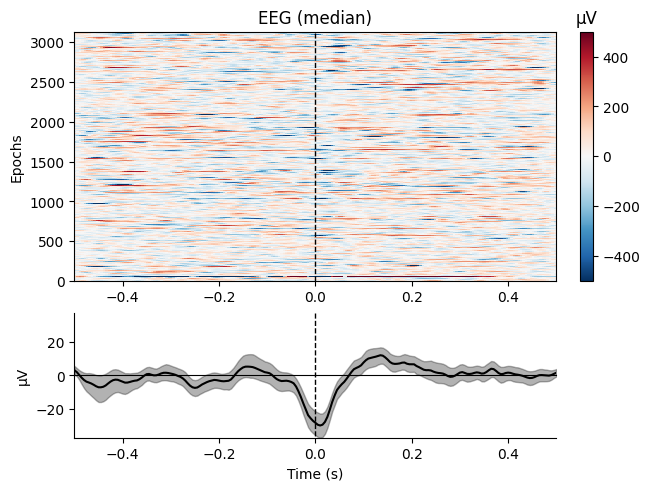

<Epochs | 1000 events (all good), -10 – 10 s (baseline off), ~122.1 MiB, data loaded,
 'unit_3': 136
 'unit_4': 266
 'unit_6': 53
 'unit_2': 220
 'unit_5': 40
 'unit_1': 285>
<Epochs | 89 events (all good), -10 – 10 s (baseline off), ~10.9 MiB, data loaded,
 '1': 89>
computing tfr


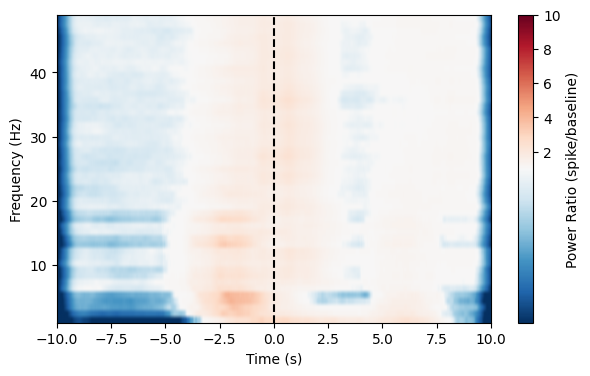

<Epochs | 3484 events (all good), -0.5 – 0.5 s (baseline -10 – -5 s (baseline period was cropped after baseline correction)), ~21.4 MiB, data loaded,
 'unit_2': 3484>


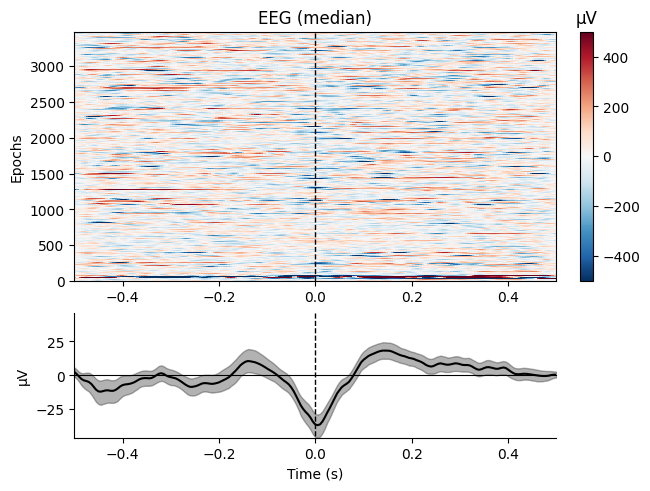

<Epochs | 1000 events (all good), -10 – 10 s (baseline off), ~122.1 MiB, data loaded,
 'unit_3': 119
 'unit_4': 236
 'unit_6': 64
 'unit_2': 266
 'unit_5': 33
 'unit_1': 282>
<Epochs | 89 events (all good), -10 – 10 s (baseline off), ~10.9 MiB, data loaded,
 '1': 89>
computing tfr


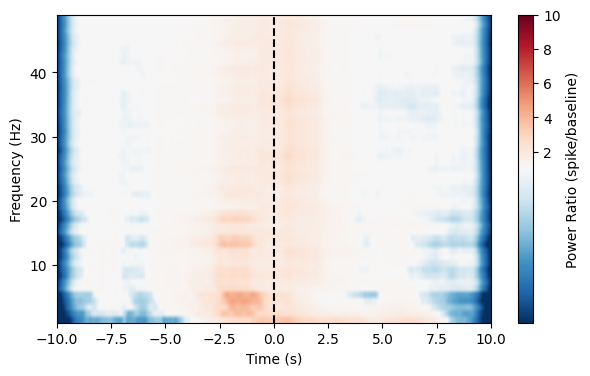

<Epochs | 1391 events (all good), -0.5 – 0.5 s (baseline -10 – -5 s (baseline period was cropped after baseline correction)), ~8.5 MiB, data loaded,
 'unit_3': 1391>


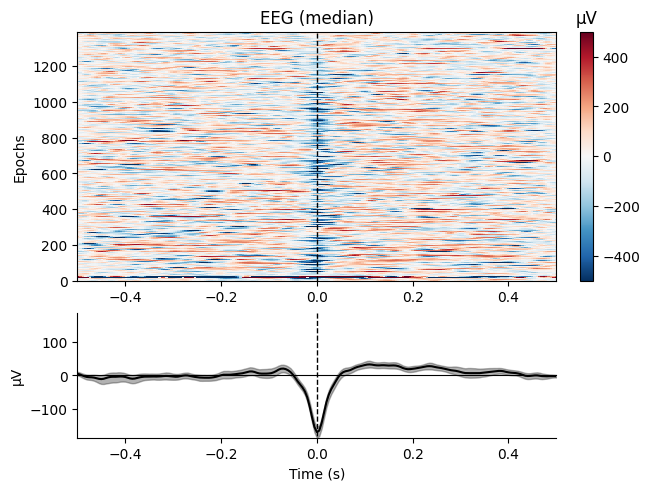

<Epochs | 1000 events (all good), -10 – 10 s (baseline off), ~122.1 MiB, data loaded,
 'unit_3': 154
 'unit_4': 229
 'unit_6': 57
 'unit_2': 224
 'unit_5': 53
 'unit_1': 283>
<Epochs | 89 events (all good), -10 – 10 s (baseline off), ~10.9 MiB, data loaded,
 '1': 89>
computing tfr


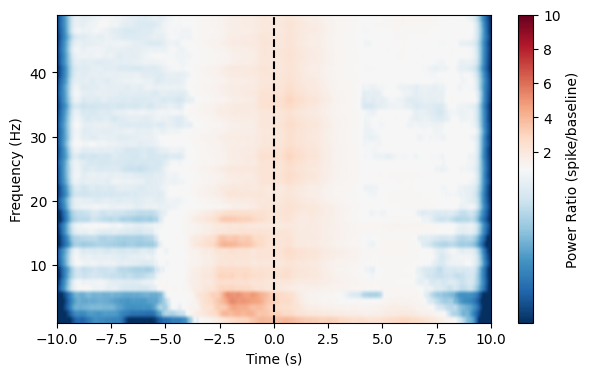

<Epochs | 2773 events (all good), -0.5 – 0.5 s (baseline -10 – -5 s (baseline period was cropped after baseline correction)), ~17.0 MiB, data loaded,
 'unit_4': 2773>


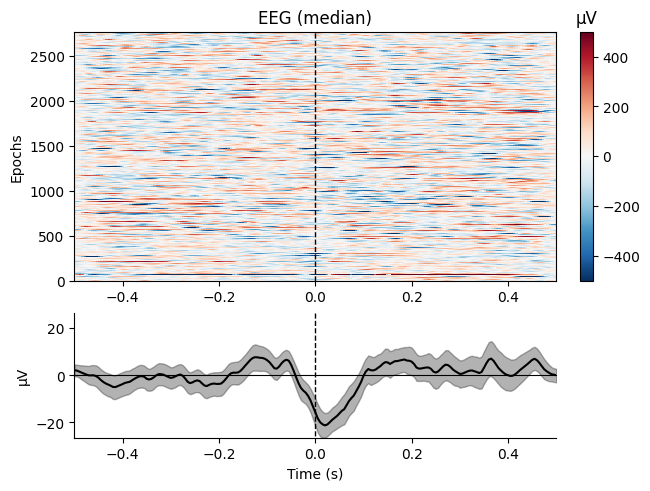

<Epochs | 1000 events (all good), -10 – 10 s (baseline off), ~122.1 MiB, data loaded,
 'unit_3': 119
 'unit_4': 254
 'unit_6': 50
 'unit_2': 246
 'unit_5': 49
 'unit_1': 282>
<Epochs | 89 events (all good), -10 – 10 s (baseline off), ~10.9 MiB, data loaded,
 '1': 89>
computing tfr


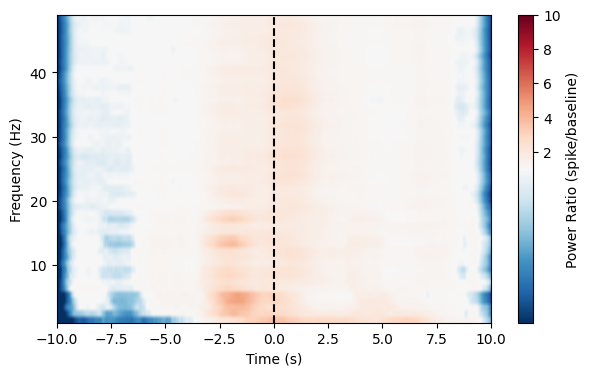

<Epochs | 462 events (all good), -0.5 – 0.5 s (baseline -10 – -5 s (baseline period was cropped after baseline correction)), ~2.8 MiB, data loaded,
 'unit_5': 462>


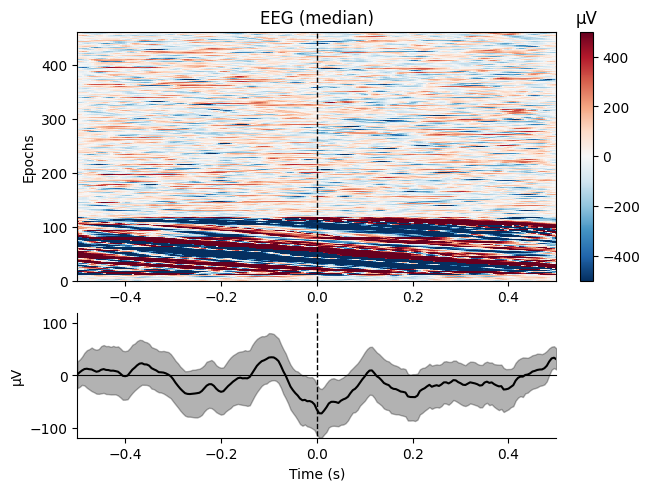

<Epochs | 1000 events (all good), -10 – 10 s (baseline off), ~122.1 MiB, data loaded,
 'unit_3': 126
 'unit_4': 269
 'unit_6': 62
 'unit_2': 239
 'unit_5': 44
 'unit_1': 260>
<Epochs | 89 events (all good), -10 – 10 s (baseline off), ~10.9 MiB, data loaded,
 '1': 89>
computing tfr


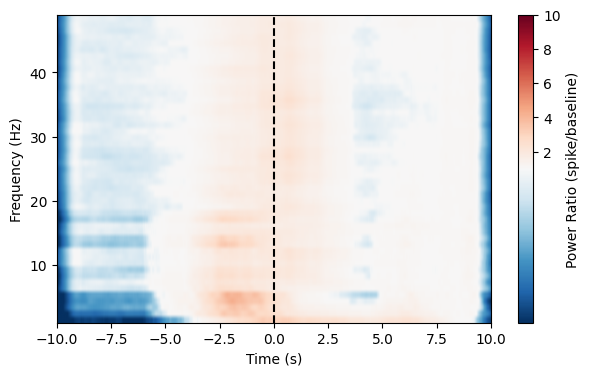

<Epochs | 619 events (all good), -0.5 – 0.5 s (baseline -10 – -5 s (baseline period was cropped after baseline correction)), ~3.8 MiB, data loaded,
 'unit_6': 619>


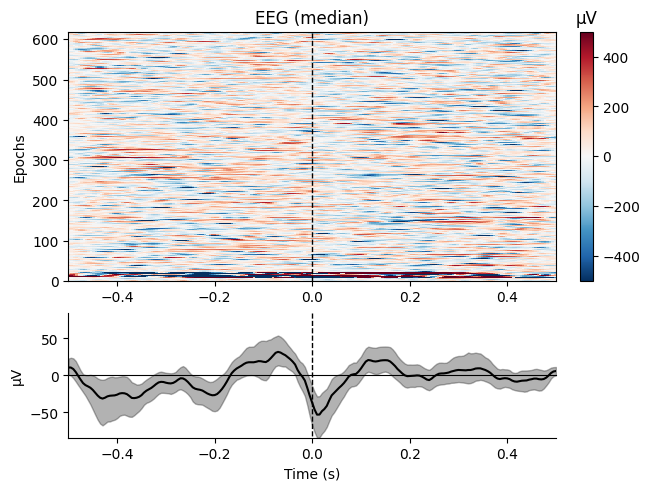

<Epochs | 1000 events (all good), -10 – 10 s (baseline off), ~122.1 MiB, data loaded,
 'unit_3': 115
 'unit_4': 271
 'unit_6': 53
 'unit_2': 239
 'unit_5': 40
 'unit_1': 282>
<Epochs | 89 events (all good), -10 – 10 s (baseline off), ~10.9 MiB, data loaded,
 '1': 89>
computing tfr


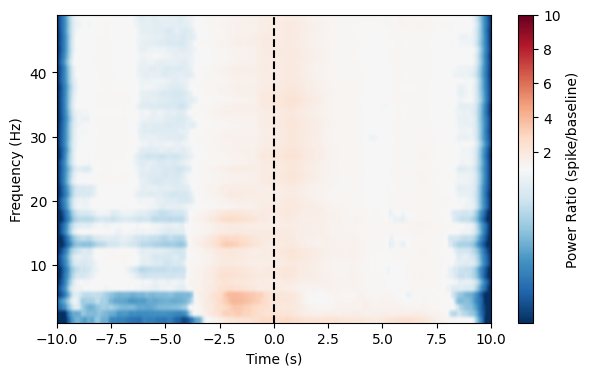

Event IDs: {'unit_1': 1, 'unit_2': 2, 'unit_3': 3, 'unit_4': 4}
<Epochs | 1967 events (all good), -0.5 – 0.5 s (baseline -10 – -5 s (baseline period was cropped after baseline correction)), ~12.1 MiB, data loaded,
 'unit_1': 1967>


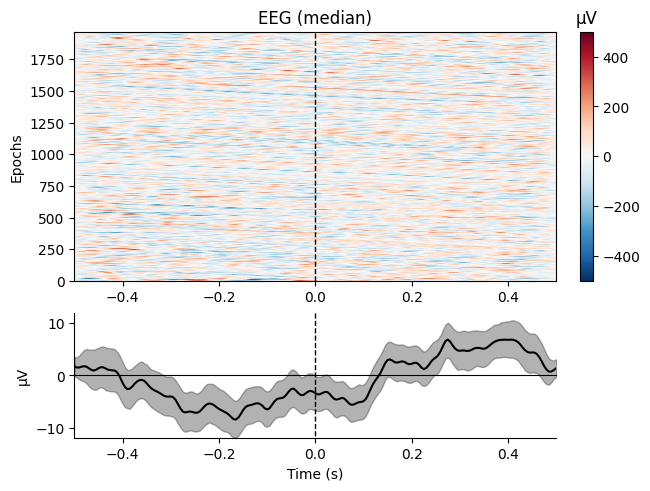

<Epochs | 1000 events (all good), -10 – 10 s (baseline off), ~122.1 MiB, data loaded,
 'unit_3': 291
 'unit_1': 352
 'unit_2': 275
 'unit_4': 82>
<Epochs | 47 events (all good), -10 – 10 s (baseline off), ~5.7 MiB, data loaded,
 '1': 47>
computing tfr


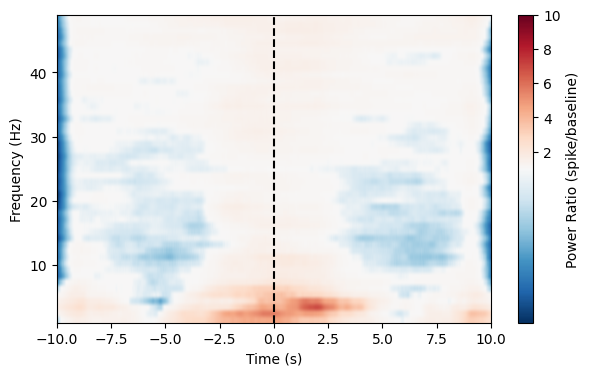

<Epochs | 1683 events (all good), -0.5 – 0.5 s (baseline -10 – -5 s (baseline period was cropped after baseline correction)), ~10.3 MiB, data loaded,
 'unit_2': 1683>


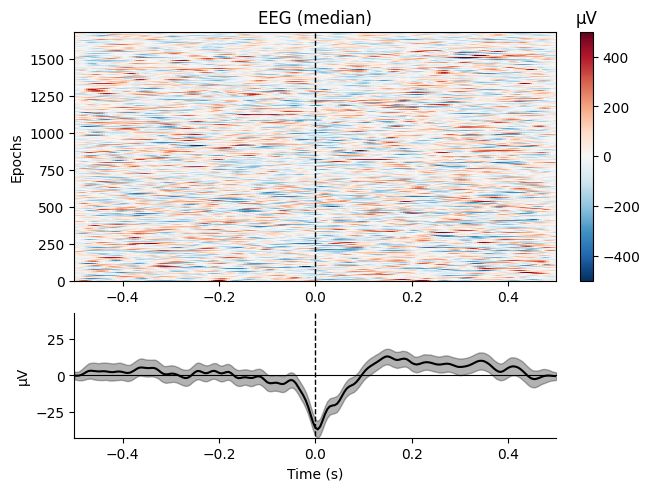

<Epochs | 1000 events (all good), -10 – 10 s (baseline off), ~122.1 MiB, data loaded,
 'unit_3': 275
 'unit_1': 352
 'unit_2': 291
 'unit_4': 82>
<Epochs | 47 events (all good), -10 – 10 s (baseline off), ~5.7 MiB, data loaded,
 '1': 47>
computing tfr


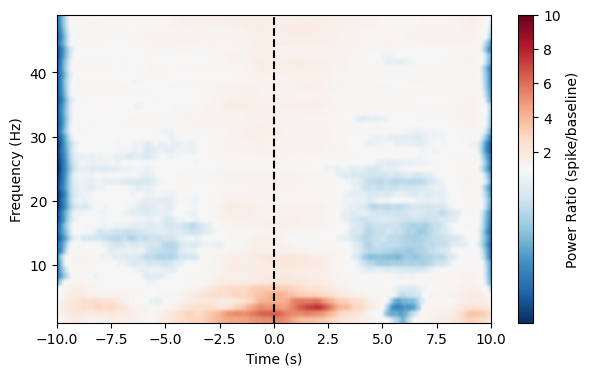

<Epochs | 1615 events (all good), -0.5 – 0.5 s (baseline -10 – -5 s (baseline period was cropped after baseline correction)), ~9.9 MiB, data loaded,
 'unit_3': 1615>


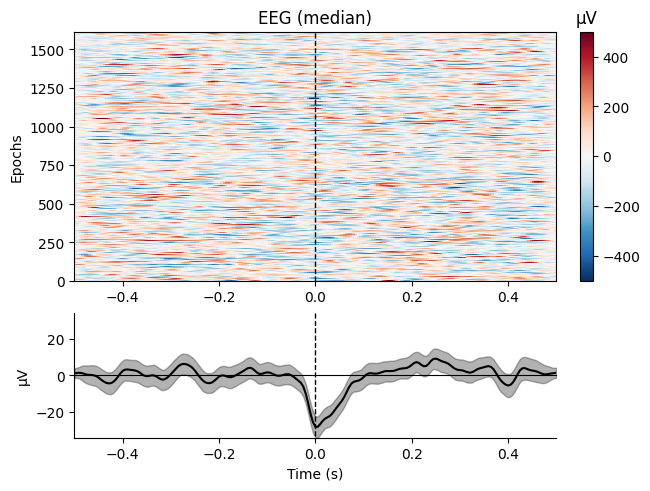

<Epochs | 1000 events (all good), -10 – 10 s (baseline off), ~122.1 MiB, data loaded,
 'unit_3': 270
 'unit_1': 367
 'unit_2': 277
 'unit_4': 86>
<Epochs | 47 events (all good), -10 – 10 s (baseline off), ~5.7 MiB, data loaded,
 '1': 47>
computing tfr


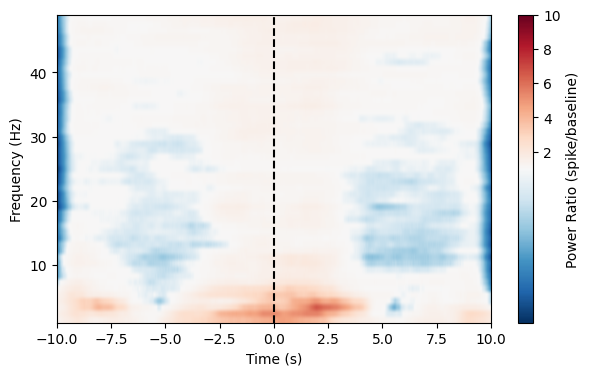

<Epochs | 466 events (all good), -0.5 – 0.5 s (baseline -10 – -5 s (baseline period was cropped after baseline correction)), ~2.9 MiB, data loaded,
 'unit_4': 466>


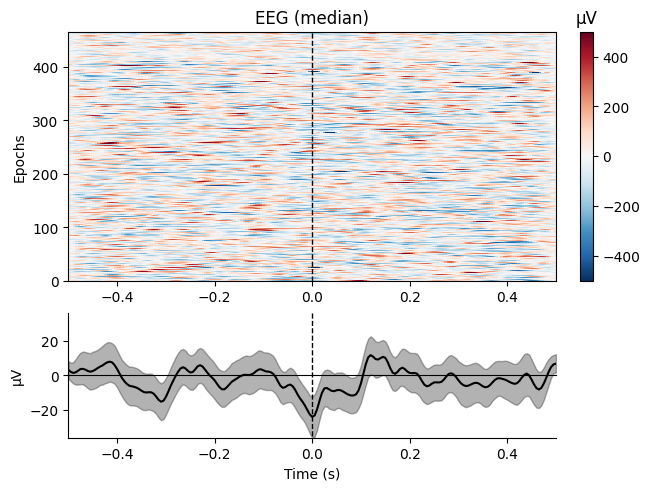

<Epochs | 1000 events (all good), -10 – 10 s (baseline off), ~122.1 MiB, data loaded,
 'unit_3': 278
 'unit_1': 349
 'unit_2': 297
 'unit_4': 76>
<Epochs | 47 events (all good), -10 – 10 s (baseline off), ~5.7 MiB, data loaded,
 '1': 47>
computing tfr


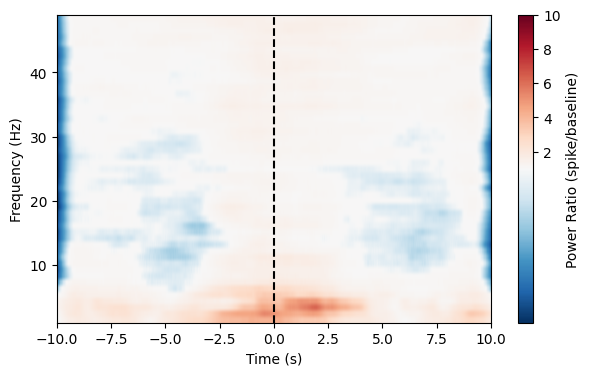

Event IDs: {'unit_1': 1, 'unit_2': 2, 'unit_3': 3, 'unit_4': 4}
<Epochs | 1203 events (all good), -0.5 – 0.5 s (baseline -10 – -5 s (baseline period was cropped after baseline correction)), ~7.4 MiB, data loaded,
 'unit_1': 1203>


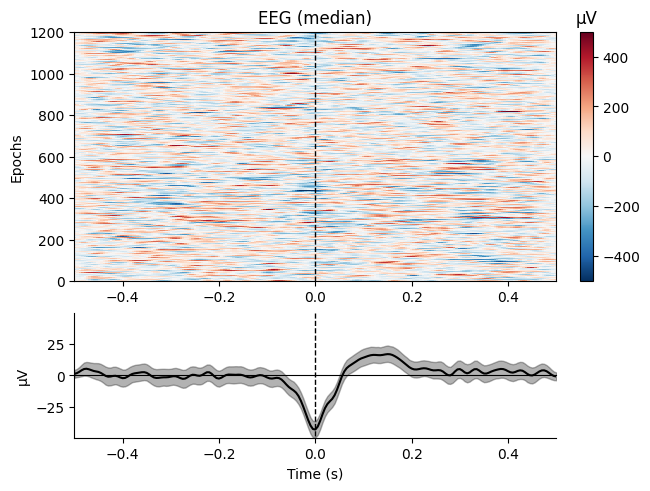

<Epochs | 1000 events (all good), -10 – 10 s (baseline off), ~122.1 MiB, data loaded,
 'unit_3': 114
 'unit_1': 144
 'unit_2': 200
 'unit_4': 542>
<Epochs | 44 events (all good), -10 – 10 s (baseline off), ~5.4 MiB, data loaded,
 '1': 44>
computing tfr


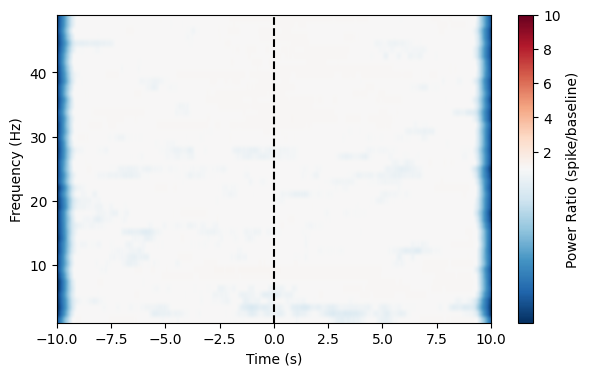

<Epochs | 1736 events (all good), -0.5 – 0.5 s (baseline -10 – -5 s (baseline period was cropped after baseline correction)), ~10.7 MiB, data loaded,
 'unit_2': 1736>


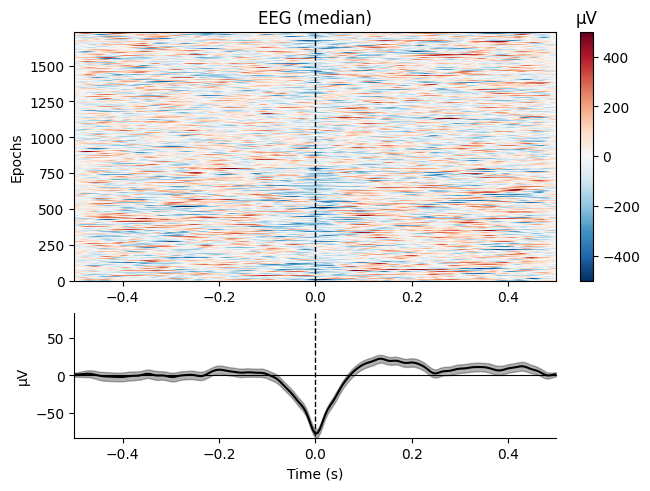

<Epochs | 1000 events (all good), -10 – 10 s (baseline off), ~122.1 MiB, data loaded,
 'unit_3': 120
 'unit_1': 155
 'unit_2': 225
 'unit_4': 500>
<Epochs | 44 events (all good), -10 – 10 s (baseline off), ~5.4 MiB, data loaded,
 '1': 44>
computing tfr


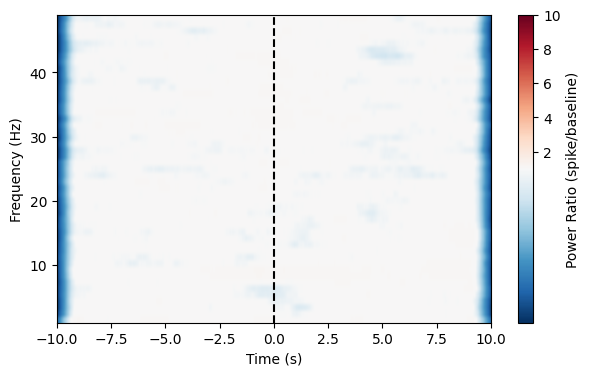

<Epochs | 971 events (all good), -0.5 – 0.5 s (baseline -10 – -5 s (baseline period was cropped after baseline correction)), ~6.0 MiB, data loaded,
 'unit_3': 971>


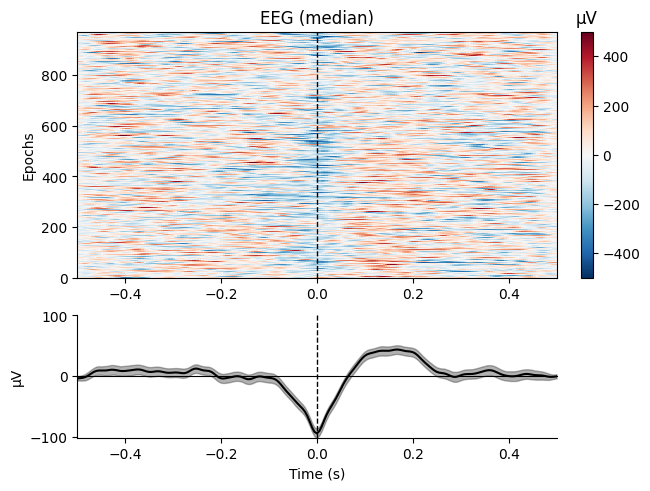

<Epochs | 1000 events (all good), -10 – 10 s (baseline off), ~122.1 MiB, data loaded,
 'unit_3': 131
 'unit_1': 139
 'unit_2': 209
 'unit_4': 521>
<Epochs | 44 events (all good), -10 – 10 s (baseline off), ~5.4 MiB, data loaded,
 '1': 44>
computing tfr


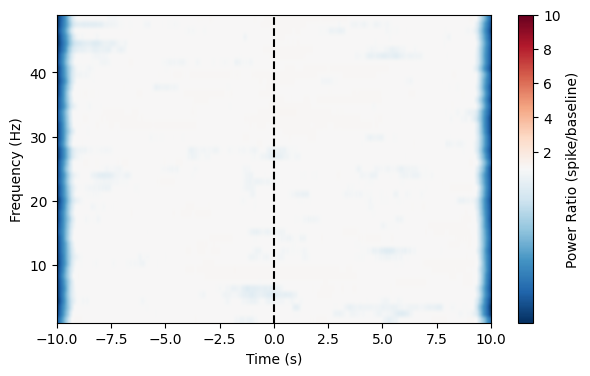

<Epochs | 4093 events (all good), -0.5 – 0.5 s (baseline -10 – -5 s (baseline period was cropped after baseline correction)), ~25.1 MiB, data loaded,
 'unit_4': 4093>


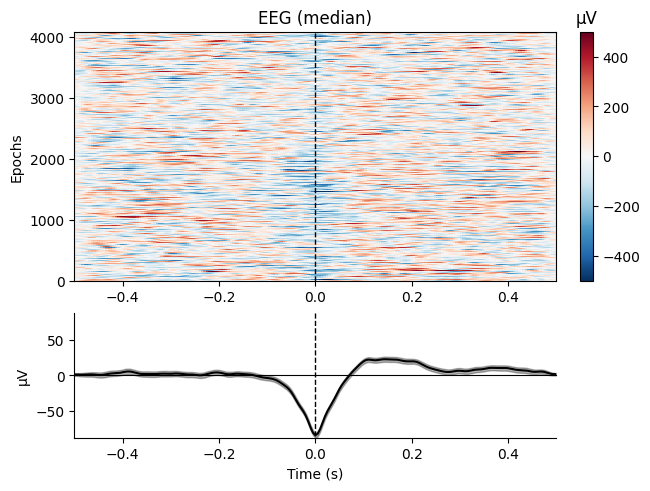

<Epochs | 1000 events (all good), -10 – 10 s (baseline off), ~122.1 MiB, data loaded,
 'unit_3': 137
 'unit_1': 150
 'unit_2': 208
 'unit_4': 505>
<Epochs | 44 events (all good), -10 – 10 s (baseline off), ~5.4 MiB, data loaded,
 '1': 44>
computing tfr


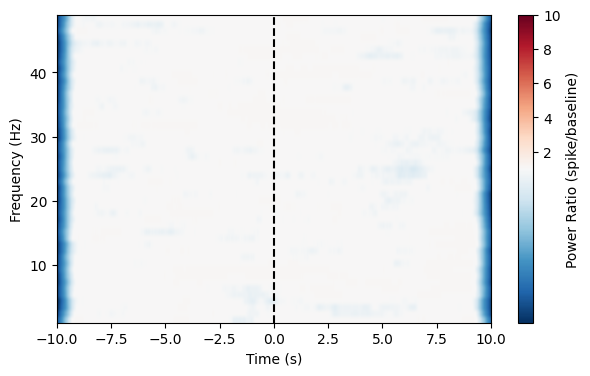

Event IDs: {'unit_1': 1, 'unit_2': 2, 'unit_3': 3, 'unit_4': 4, 'unit_5': 5, 'unit_6': 6, 'unit_7': 7, 'unit_8': 8}
<Epochs | 7123 events (all good), -0.5 – 0.5 s (baseline -10 – -5 s (baseline period was cropped after baseline correction)), ~43.7 MiB, data loaded,
 'unit_1': 7123>


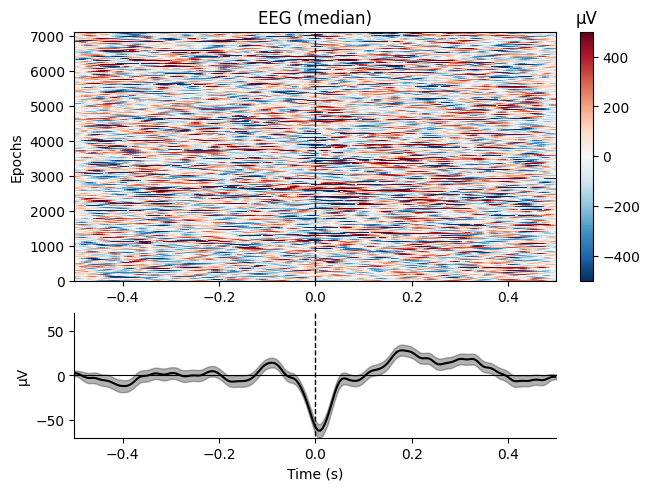

<Epochs | 1000 events (all good), -10 – 10 s (baseline off), ~122.1 MiB, data loaded,
 'unit_3': 53
 'unit_8': 21
 'unit_4': 45
 'unit_6': 139
 'unit_7': 104
 'unit_2': 184
 'unit_5': 198
 'unit_1': 256>
<Epochs | 29 events (all good), -10 – 10 s (baseline off), ~3.5 MiB, data loaded,
 '1': 29>
computing tfr


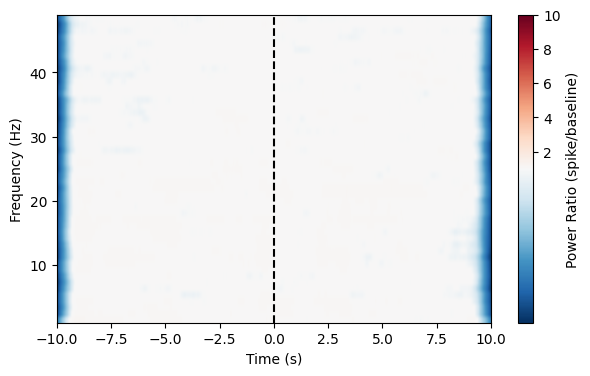

<Epochs | 5864 events (all good), -0.5 – 0.5 s (baseline -10 – -5 s (baseline period was cropped after baseline correction)), ~36.0 MiB, data loaded,
 'unit_2': 5864>


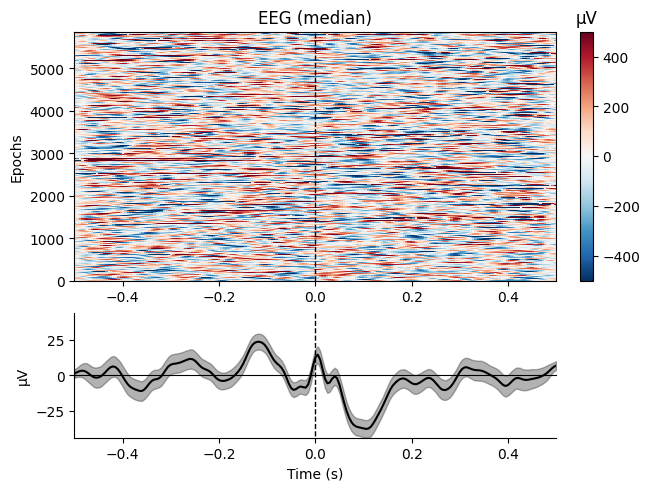

<Epochs | 1000 events (all good), -10 – 10 s (baseline off), ~122.1 MiB, data loaded,
 'unit_3': 50
 'unit_8': 16
 'unit_4': 37
 'unit_6': 137
 'unit_7': 114
 'unit_2': 190
 'unit_5': 196
 'unit_1': 260>
<Epochs | 29 events (all good), -10 – 10 s (baseline off), ~3.5 MiB, data loaded,
 '1': 29>
computing tfr


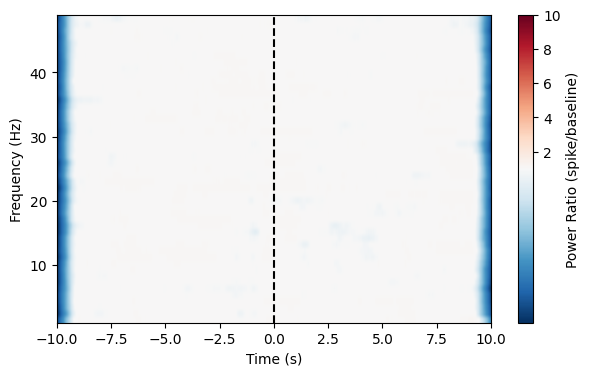

<Epochs | 1627 events (all good), -0.5 – 0.5 s (baseline -10 – -5 s (baseline period was cropped after baseline correction)), ~10.0 MiB, data loaded,
 'unit_3': 1627>


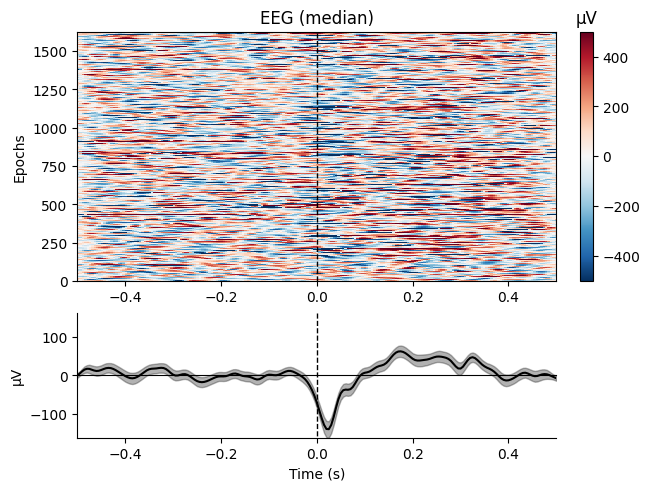

<Epochs | 1000 events (all good), -10 – 10 s (baseline off), ~122.1 MiB, data loaded,
 'unit_3': 46
 'unit_8': 16
 'unit_4': 48
 'unit_6': 157
 'unit_7': 103
 'unit_2': 205
 'unit_5': 184
 'unit_1': 241>
<Epochs | 29 events (all good), -10 – 10 s (baseline off), ~3.5 MiB, data loaded,
 '1': 29>
computing tfr


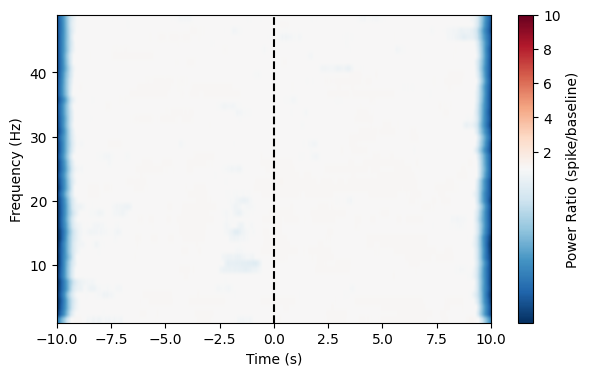

<Epochs | 1541 events (all good), -0.5 – 0.5 s (baseline -10 – -5 s (baseline period was cropped after baseline correction)), ~9.5 MiB, data loaded,
 'unit_4': 1541>


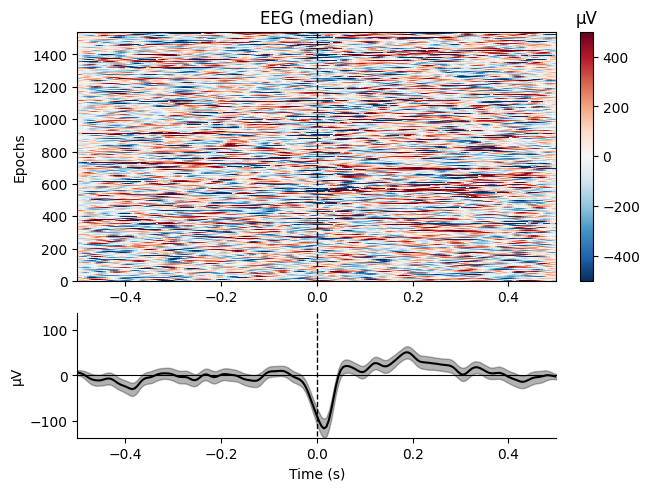

<Epochs | 1000 events (all good), -10 – 10 s (baseline off), ~122.1 MiB, data loaded,
 'unit_3': 57
 'unit_8': 21
 'unit_4': 56
 'unit_6': 145
 'unit_7': 96
 'unit_2': 202
 'unit_5': 195
 'unit_1': 228>
<Epochs | 29 events (all good), -10 – 10 s (baseline off), ~3.5 MiB, data loaded,
 '1': 29>
computing tfr


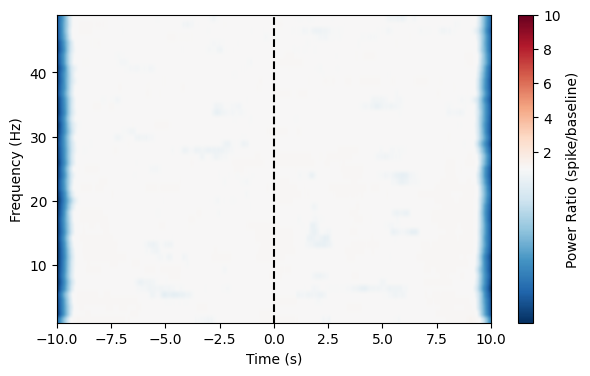

<Epochs | 5749 events (all good), -0.5 – 0.5 s (baseline -10 – -5 s (baseline period was cropped after baseline correction)), ~35.3 MiB, data loaded,
 'unit_5': 5749>


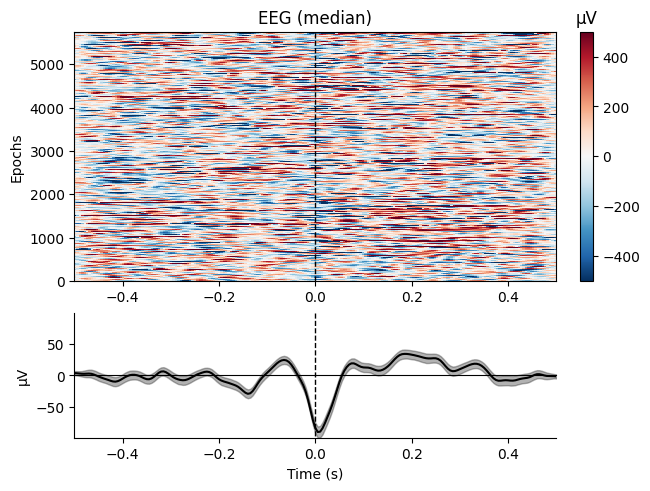

<Epochs | 1000 events (all good), -10 – 10 s (baseline off), ~122.1 MiB, data loaded,
 'unit_3': 52
 'unit_8': 16
 'unit_4': 46
 'unit_6': 151
 'unit_7': 110
 'unit_2': 203
 'unit_5': 194
 'unit_1': 228>
<Epochs | 29 events (all good), -10 – 10 s (baseline off), ~3.5 MiB, data loaded,
 '1': 29>
computing tfr


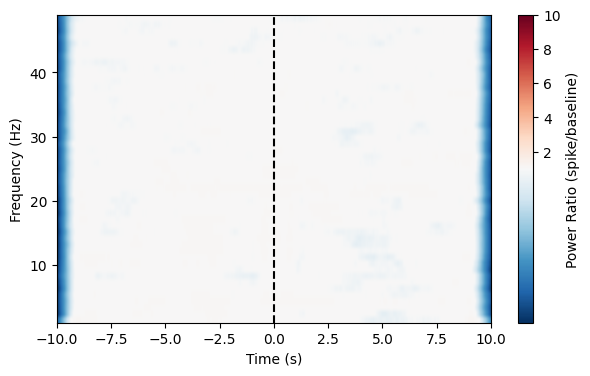

<Epochs | 4500 events (all good), -0.5 – 0.5 s (baseline -10 – -5 s (baseline period was cropped after baseline correction)), ~27.6 MiB, data loaded,
 'unit_6': 4500>


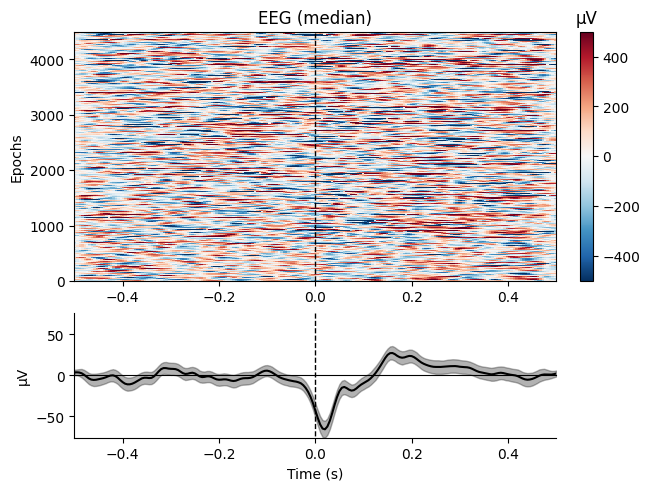

<Epochs | 1000 events (all good), -10 – 10 s (baseline off), ~122.1 MiB, data loaded,
 'unit_3': 52
 'unit_8': 16
 'unit_4': 41
 'unit_6': 151
 'unit_7': 113
 'unit_2': 189
 'unit_5': 191
 'unit_1': 247>
<Epochs | 29 events (all good), -10 – 10 s (baseline off), ~3.5 MiB, data loaded,
 '1': 29>
computing tfr


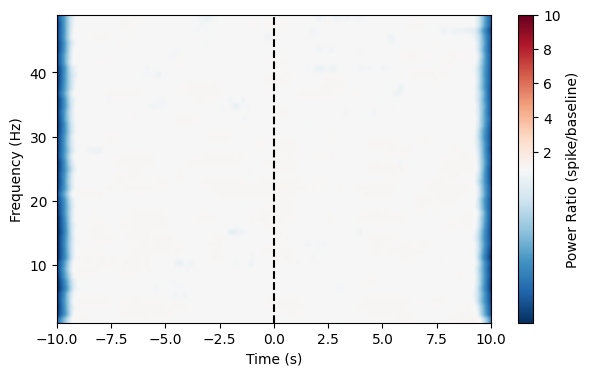

<Epochs | 3229 events (all good), -0.5 – 0.5 s (baseline -10 – -5 s (baseline period was cropped after baseline correction)), ~19.8 MiB, data loaded,
 'unit_7': 3229>


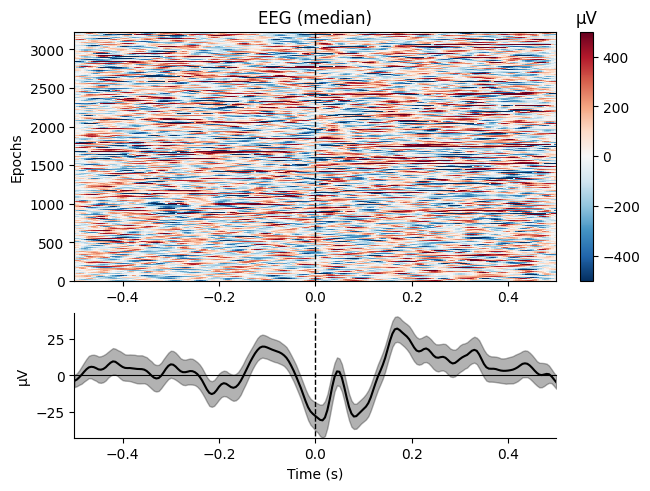

<Epochs | 1000 events (all good), -10 – 10 s (baseline off), ~122.1 MiB, data loaded,
 'unit_3': 47
 'unit_8': 18
 'unit_4': 54
 'unit_6': 142
 'unit_7': 106
 'unit_2': 186
 'unit_5': 203
 'unit_1': 244>
<Epochs | 29 events (all good), -10 – 10 s (baseline off), ~3.5 MiB, data loaded,
 '1': 29>
computing tfr


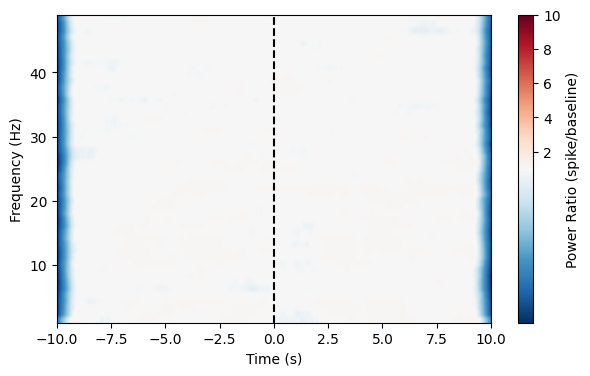

<Epochs | 1066 events (all good), -0.5 – 0.5 s (baseline -10 – -5 s (baseline period was cropped after baseline correction)), ~6.5 MiB, data loaded,
 'unit_8': 1066>


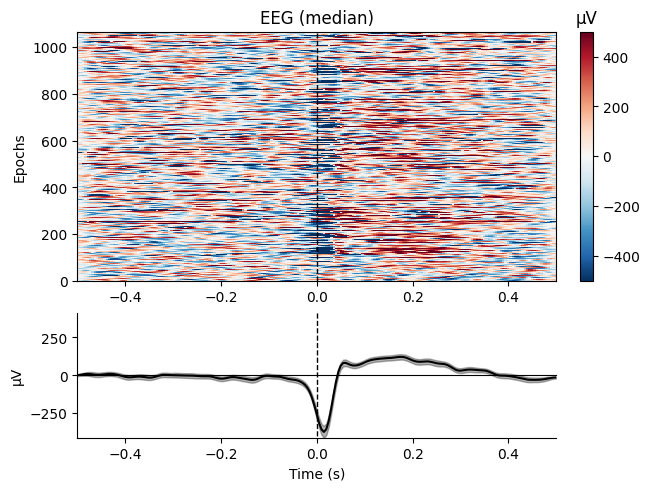

<Epochs | 1000 events (all good), -10 – 10 s (baseline off), ~122.1 MiB, data loaded,
 'unit_3': 63
 'unit_8': 21
 'unit_4': 43
 'unit_6': 141
 'unit_7': 100
 'unit_2': 179
 'unit_5': 204
 'unit_1': 249>
<Epochs | 29 events (all good), -10 – 10 s (baseline off), ~3.5 MiB, data loaded,
 '1': 29>
computing tfr


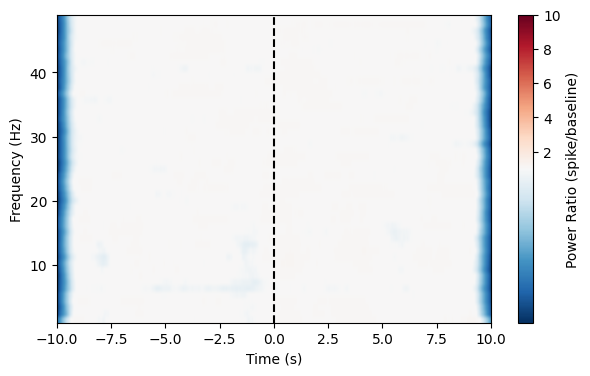

In [ ]:
mne.set_log_level('ERROR')
for i, row in testmnes.iterrows():
    raw = row['mne'].copy()
    _, event_dict = mne.events_from_annotations(raw=raw)
    print(f"Event IDs: {event_dict}")
    event_id = list(event_dict.keys())
    for unit_id in event_id:
        epochs_spike = mne.Epochs(raw, event_id=[unit_id],
                   tmin=-10, tmax=0.5, baseline=(None, -5), 
                   preload=True, event_repeated='drop')
        epochs_spike.drop_bad()
        
        epochs_spike.crop(tmin=-0.5, tmax=0.5)
        epochs_spike.filter(l_freq=1, h_freq=30)
        print(epochs_spike)

        epochs_spike.plot_image(combine='median', vmin=-500, vmax=500)
        # epochs_spike.plot_image(combine='gfp')
        plt.show()

        # Define shared parameters
        epoch_params = {
            'raw': raw,
            'event_id': event_id,
            'event_repeated': 'drop',
            'baseline': None,
            'preload': True
        }
        # NOTE what is an appropriate baseline? 10 seconds before spike might be skewed by big spike trains
        epochs_spike = mne.Epochs(**epoch_params, tmin=-10, tmax=10)
        epochs_spike = random_subsample_epochs(epochs_spike)
        epochs_spike.shift_time(-10, relative=False)
        epochs_spike.filter(l_freq=1, h_freq=50)
        print(epochs_spike)

        # baseline defined as full recording average
        epochs_baseline = mne.make_fixed_length_epochs(raw, duration=20.1, preload=True)
        epochs_baseline = random_subsample_epochs(epochs_baseline)
        epochs_baseline.shift_time(-10, relative=False)
        epochs_baseline.crop(tmin=-10, tmax=10)
        epochs_baseline.filter(l_freq=1, h_freq=50)
        print(epochs_baseline)
        
    
        tfr_kwargs = dict(
            method='multitaper',
            freqs=np.arange(1, 50, 1), 
            n_cycles=np.arange(1, 50, 1) * 2,
            use_fft=True,
            average=True
        )
        print("computing tfr")
        tfr_spike = epochs_spike.compute_tfr(**tfr_kwargs)
        tfr_baseline = epochs_baseline.compute_tfr(**tfr_kwargs)
        del epochs_spike, epochs_baseline
        # tfr_spike.apply_baseline(baseline=None)
        # tfr_baseline.apply_baseline(baseline=None)
        # tfr = tfr_spike - tfr_baseline
        # print("plotting")
        # tfr.plot(combine='mean')
        # plt.show()

        plot_tfr_ratio(tfr_spike, tfr_baseline)

        # combined_evoke = mne.combine_evoked(
        #     [epochs_spike.average(), epochs_baseline.average()], weights=[1, -1]
        # )
        # combined_evoke.plot()
        # plt.show()

        # break
    
    # tfr.plot()
    # plt.show()
    # break


In [28]:
# # sa_gcg1 = df[df['id'] == 613][['region', 'sa']]
# sa_gcg1 = df[df['id'] == 613]
# sa_gcg1 = sa_gcg1.groupby('sa_savedir').agg({'sa': 'first', 'region': 'first', 'id': 'first'})
# display(sa_gcg1)

# for i in range(len(sa_gcg1)):
#     fig, ax = plt.subplots(2, 1, figsize=(8,4), sharex=True, gridspec_kw={'height_ratios':[1, 0.3]})
#     plt.subplots_adjust(hspace=0) 

#     sw.plot_traces(sa_gcg1.iloc[i]['sa'].recording,
#                    time_range=[0, 5], 
#                    show_channel_ids=True,
#                    # color_groups=True,
#                    # color='C0',
#                    ax=ax[0],
#                   )
#     # ax[0].set_ylabel("Datawave Channel")
#     # ax[0].get_legend().remove()
#     sw.plot_rasters(sa_gcg1.iloc[i]['sa'], 
#                     time_range=[0, 5],
#                     color='black',
#                     ax=ax[1],
#                    )
#     ax[1].set_ylabel("Unit Index")
#     ax[1].set_xlabel("Time (s)")
#     fig.suptitle(f"Raster Plot {sa_gcg1.iloc[i]['id']} {sa_gcg1.iloc[i]['region']}", y=0.95)

#     plt.show()
